# Продолжение экспериментов из [DifferenceAndImportance.ipynb], но в signed вариантах

# Миллиард вспомогательных функций

In [2]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Any, Dict, List, Optional, Tuple

import math
import numpy as np
import torch
from PIL import Image

import matplotlib.pyplot as plt


# -------------------------
# Image conversions
# -------------------------

def pil_to_np_bgr(pil: Image.Image) -> np.ndarray:
    """PIL RGB -> np.uint8 BGR (H,W,3) for ultralytics predictor preprocess."""
    if pil.mode != "RGB":
        pil = pil.convert("RGB")
    rgb = np.asarray(pil)  # uint8 RGB
    bgr = rgb[..., ::-1].copy()
    return bgr


def pil_to_torch_rgb01(pil: Image.Image) -> torch.Tensor:
    """PIL -> torch float32 RGB in [0,1], shape [3,H,W] (CPU)."""
    if pil.mode != "RGB":
        pil = pil.convert("RGB")
    arr = np.asarray(pil).astype(np.float32) / 255.0
    t = torch.from_numpy(arr).permute(2, 0, 1).contiguous()
    return t


# -------------------------
# Patch application
# -------------------------

def apply_patch_to_image(
    base_pil: Image.Image,
    patch_pil: Image.Image,
    position_xy: Tuple[int, int] = (0, 0),
) -> Tuple[Image.Image, Optional[torch.Tensor], int]:
    """Paste patch onto base image at (x,y). Returns patched PIL, bbox_xyxy, area_px."""
    if base_pil.mode != "RGB":
        base_pil = base_pil.convert("RGB")
    if patch_pil.mode != "RGB":
        patch_pil = patch_pil.convert("RGB")
    base_w, base_h = base_pil.size
    patch_w, patch_h = patch_pil.size
    x, y = position_xy
    x1 = max(0, int(x))
    y1 = max(0, int(y))
    x2 = min(base_w, int(x) + patch_w)
    y2 = min(base_h, int(y) + patch_h)
    if x2 <= x1 or y2 <= y1:
        return base_pil.copy(), None, 0
    # Crop patch if it spills outside the base image.
    px1 = x1 - int(x)
    py1 = y1 - int(y)
    px2 = px1 + (x2 - x1)
    py2 = py1 + (y2 - y1)
    patch_crop = patch_pil.crop((px1, py1, px2, py2))
    out = base_pil.copy()
    out.paste(patch_crop, (x1, y1))
    bbox = torch.tensor([float(x1), float(y1), float(x2), float(y2)], dtype=torch.float32)
    area = int((x2 - x1) * (y2 - y1))
    return out, bbox, area


def letterbox_pil(pil: Image.Image, imgsz: int, color: Tuple[int, int, int] = (114, 114, 114)) -> Image.Image:
    """Resize+pad image to square imgsz, matching Ultralytics letterbox behavior."""
    if pil.mode != "RGB":
        pil = pil.convert("RGB")
    w, h = pil.size
    r = min(imgsz / h, imgsz / w)
    new_w = int(round(w * r))
    new_h = int(round(h * r))
    resized = pil.resize((new_w, new_h), Image.BILINEAR)
    out = Image.new("RGB", (imgsz, imgsz), color)
    pad_w = int((imgsz - new_w) / 2)
    pad_h = int((imgsz - new_h) / 2)
    out.paste(resized, (pad_w, pad_h))
    return out

from pathlib import Path
import random
from typing import List


def collect_images(
    folder: Path,
    n: int,
    extensions: tuple[str, ...] = (".png", ".jpg", ".jpeg"),
    shuffle: bool = False,
    seed: int | None = 42,
) -> List[str]:
    """
    Берёт n изображений из папки.
    Если shuffle=True — случайная выборка (с фиксируемым seed).
    """
    files = [
        p for p in folder.iterdir()
        if p.is_file() and p.suffix.lower() in extensions
    ]

    if not files:
        raise RuntimeError(f"В папке {folder} нет изображений")

    if shuffle:
        if seed is not None:
            random.seed(seed)
        random.shuffle(files)

    return [str(p) for p in files[:n]]

def _load_ultralytics_yolo(model_path: str):
    try:
        from ultralytics import YOLO
    except Exception as e:
        raise RuntimeError(
            "Не удалось импортировать ultralytics. Установите пакет ultralytics или убедитесь, что среда активна."
        ) from e
    return YOLO(model_path)


def _get_class_id_from_names(names: Dict[int, str], class_name: str) -> Optional[int]:
    class_name = class_name.lower().strip()
    for k, v in names.items():
        if str(v).lower().strip() == class_name:
            return int(k)
    return None


@torch.no_grad()
def yolo_predict_conf_scalar(
    yolo_model,
    pil_img: Image.Image,
    imgsz: int,
    target_class_id: Optional[int],
    conf: float = 0.001,
) -> Tuple[float, Any]:
    """Ultralytics predict -> scalar confidence (NMS-based) + raw Results."""
    bgr = pil_to_np_bgr(pil_img)
    res = yolo_model.predict(source=bgr, imgsz=imgsz, conf=conf, verbose=False)[0]

    if res.boxes is None or len(res.boxes) == 0:
        return 0.0, res

    confs = res.boxes.conf.detach().cpu().numpy()
    clss = res.boxes.cls.detach().cpu().numpy().astype(int)

    if target_class_id is None:
        return float(confs.max(initial=0.0)), res

    mask = (clss == int(target_class_id))
    if not np.any(mask):
        return 0.0, res

    return float(confs[mask].max(initial=0.0)), res

def build_clean_and_patched_letterboxed(
    base_pil: Image.Image,
    patch_pil: Image.Image,
    cfg: ExpConfig,
) -> Tuple[Image.Image, Image.Image, Optional[torch.Tensor]]:
    clean_lb = letterbox_pil(base_pil, imgsz=cfg.imgsz)

    if cfg.apply_patch_after_letterbox:
        patched_lb, bbox, _ = apply_patch_to_image(clean_lb, patch_pil, cfg.patch_xy)
        return clean_lb, patched_lb, bbox

    patched_orig, _bbox_orig, _ = apply_patch_to_image(base_pil, patch_pil, cfg.patch_xy)
    patched_lb = letterbox_pil(patched_orig, imgsz=cfg.imgsz)
    return clean_lb, patched_lb, None

def pick_center_person_bbox_from_results(
    res,
    target_class_id: int,
    imgsz: int,
    strategy: str = "score",
    min_conf: float = 0.10,
    min_area_frac: float = 0.01,
    ar_range: Tuple[float, float] = (0.15, 1.20),
    w_conf: float = 1.0,
    w_area: float = 0.6,
    w_dist: float = 0.4,
    w_ar: float = 0.2,
):
    """Pick the most plausible 'person' bbox from YOLO post-NMS detections.

    Why this exists:
      Center-closest can pick tiny false positives near center.

    Strategies:
      - 'center' : legacy center-closest (kept for debugging)
      - 'conf'   : highest confidence (tie-breaker by area)
      - 'area'   : largest area (tie-breaker by confidence)
      - 'score'  : weighted score combining confidence, area, center-distance and aspect-ratio prior

    Returns dict: {picked_bbox: [x1,y1,x2,y2], picked_conf: float, picked_idx: int}
    or {} if no person found.
    """
    if res is None or getattr(res, "boxes", None) is None or len(res.boxes) == 0:
        return {}

    xyxy = res.boxes.xyxy.detach().cpu().numpy()          # (N,4)
    conf = res.boxes.conf.detach().cpu().numpy()          # (N,)
    cls  = res.boxes.cls.detach().cpu().numpy().astype(int)  # (N,)

    m = (cls == int(target_class_id))
    if not np.any(m):
        return {}

    idxs = np.flatnonzero(m)
    xyxy_p = xyxy[m]
    conf_p = conf[m]

        # geometry
    w = (xyxy_p[:, 2] - xyxy_p[:, 0]).clip(min=0.0)
    h = (xyxy_p[:, 3] - xyxy_p[:, 1]).clip(min=0.0)
    area = w * h

    # basic filtering to avoid tiny garbage boxes
    min_area = float(min_area_frac) * float(imgsz) * float(imgsz)
    keep = (conf_p >= float(min_conf)) & (area >= min_area)

    # aspect-ratio prior for a person box in full-body-ish imagery (very loose)
    ar = w / (h + 1e-9)  # width/height
    keep = keep & (ar >= float(ar_range[0])) & (ar <= float(ar_range[1]))

    if not np.any(keep):
        # Fallback: just keep the best-conf person (even if small)
        j = int(np.argmax(conf_p))
        picked_idx = int(idxs[j])
        return {
            "picked_bbox": [float(v) for v in xyxy_p[j].tolist()],
            "picked_conf": float(conf_p[j]),
            "picked_idx": picked_idx,
        }

    xyxy_p = xyxy_p[keep]
    conf_p = conf_p[keep]
    area = area[keep]
    ar = ar[keep]
    idxs = idxs[keep]

    # center distance (normalized)

    cx = 0.5 * (xyxy_p[:, 0] + xyxy_p[:, 2])
    cy = 0.5 * (xyxy_p[:, 1] + xyxy_p[:, 3])
    dx = (cx - (float(imgsz) * 0.5)) / float(imgsz)
    dy = (cy - (float(imgsz) * 0.5)) / float(imgsz)
    dist = np.sqrt(dx * dx + dy * dy)  # 0..~0.7

    strategy = str(strategy).lower().strip()

    if strategy == "center":
        j = int(np.argmin(dist))
    elif strategy == "conf":
        # tie-breaker: larger area
        j = int(np.lexsort((-area, -conf_p))[-1])

    elif strategy == "area":
        # tie-breaker: higher conf
        j = int(np.lexsort((-conf_p, -area))[-1])

    elif strategy == "score":
        # normalize area to [0,1] by image area; then compress with sqrt to reduce dominance
        area_n = np.sqrt(area / (float(imgsz) * float(imgsz) + 1e-9))

        # aspect ratio prior: prefer tall-ish boxes (smaller ar). Use a soft penalty around ar~0.5
        # penalty in [0,1], 0 best.
        ar_target = 0.55
        ar_pen = np.clip(np.abs(ar - ar_target) / 0.65, 0.0, 1.0)

        # score: higher is better
        score = (
            float(w_conf) * conf_p
            + float(w_area) * area_n
            - float(w_dist) * dist
            - float(w_ar) * ar_pen
        )
        j = int(np.argmax(score))

    else:
        raise ValueError(f"Unknown strategy='{strategy}'")

    picked_idx = int(idxs[j])

    return {
        "picked_bbox": [float(v) for v in xyxy_p[j].tolist()],
        "picked_conf": float(conf_p[j]),
        "picked_idx": picked_idx,
    }

In [3]:
# We do NOT trust folder labels fully; we will oversample from folders and then
# select a balanced set by the *computed* success flag (drop > CFG.success_thresh).
N_FROM_EACH_DIR = 150   # how many files to pull from each folder initially
N_SUCCESS = 100         # how many SUCCESS examples to keep after labeling
N_FAIL = 100            # how many FAIL examples to keep after labeling
SEED = 17

# successful_dir = Path("../stats/attack_split/success")
# unsuccessful_dir = Path("../stats/attack_split/fail")

successful_dir = Path("successful_examples")
unsuccessful_dir = Path("unsuccessful_examples")

image_paths = (
    collect_images(successful_dir, N_FROM_EACH_DIR, shuffle=True, seed=SEED)
    + collect_images(unsuccessful_dir, N_FROM_EACH_DIR, shuffle=True, seed=SEED)
)
patch_path = "data/patch.png"

@dataclass
class ExpConfig:
    # путь к весам (можно заменить на локальный)
    model_path: str = "yolo11s.pt"

    # размер входа
    imgsz: int = 640

    # устройство
    device: str = "cuda" if torch.cuda.is_available() else "mps" if torch.mps.is_available() else "cpu"

    # True: накладываем патч уже на letterbox-изображение (самый честный режим)
    # False: накладываем на оригинал, потом делаем letterbox
    apply_patch_after_letterbox: bool = True

    # позиция патча (x,y) в координатах того изображения, куда накладываем
    patch_xy: Tuple[int, int] = (0, 0)

    # целевой класс (None => берём max по всем классам)
    target_class_name: Optional[str] = "person"

    # успех атаки: падение скаляра уверенности >= threshold
    success_thresh: float = 0.30

    # число каналов, используемое в top-k метриках и в абляциях
    topk_channels: int = 32

    # ROI scalar reduction for attribution: "max" | "logsumexp" | "topk_mean"
    roi_reduce: str = "logsumexp"

    # temperature for logsumexp (larger -> closer to max)
    roi_lse_temp: float = 20.0

    # k for topk_mean
    roi_topk: int = 10

    # --- ROI attribution layer selection ---
    # How many layers to keep for ROI-attribution (set 1 to mimic the previous "single good layer" behavior)
    roi_keep_topk_layers: int = 1

    # How many near-head conv layers to consider as candidates
    roi_candidate_last_n_layers: int = 8

    # How many examples from each group (success/fail) to use for scanning grad signal
    roi_scan_n_per_group: int = 2

    # Minimum median ma_abs.max required to accept a layer (0.0 keeps the best even if tiny)
    roi_min_grad_strength: float = 0.0

CFG = ExpConfig()

In [4]:
import torch.nn as nn


def pick_default_conv_layers(model_torch: nn.Module, n_layers: int = 12) -> List[str]:
    convs: List[str] = []
    for n, m in model_torch.named_modules():
        if isinstance(m, nn.Conv2d):
            convs.append(n)
    if not convs:
        raise RuntimeError("Не удалось найти Conv2d модули в модели.")

    idxs = np.linspace(0, len(convs) - 1, num=min(n_layers, len(convs))).round().astype(int)
    picked = []
    seen = set()
    for i in idxs:
        name = convs[int(i)]
        if name not in seen:
            picked.append(name)
            seen.add(name)
    return picked


def get_module_by_name(model_torch: nn.Module, name: str) -> nn.Module:
    d = dict(model_torch.named_modules())
    if name not in d:
        raise KeyError(f"Layer '{name}' not found.")
    return d[name]


@torch.no_grad()
def torch_preprocess_letterboxed(pil_img_lb: Image.Image, device: str, dtype: torch.dtype) -> torch.Tensor:
    """Preprocess PIL -> BCHW tensor on the requested device/dtype."""
    t = pil_to_torch_rgb01(pil_img_lb)  # CPU float32 [3,H,W]
    t = t.unsqueeze(0)  # [1,3,H,W]
    return t.to(device=device, dtype=dtype, non_blocking=False)


def capture_activations_for_layers(
    model_torch: nn.Module,
    x_bchw: torch.Tensor,
    layer_names: List[str],
) -> Dict[str, torch.Tensor]:
    acts: Dict[str, torch.Tensor] = {}
    hooks = []

    def _mk_hook(name: str):
        def _hook(_m, _inp, out):
            # Some Ultralytics blocks can emit tuples/lists; take the first tensor.
            if isinstance(out, (list, tuple)):
                for o in out:
                    if isinstance(o, torch.Tensor):
                        out = o
                        break

            # We focus on spatial feature maps (B,C,H,W). Skip others.
            if isinstance(out, torch.Tensor) and out.ndim == 4:
                acts[name] = out.detach().cpu()
        return _hook

    for ln in layer_names:
        m = get_module_by_name(model_torch, ln)
        hooks.append(m.register_forward_hook(_mk_hook(ln)))
    # MPS requires input and weights to share device AND dtype.
    x_bchw = x_bchw.to(
        device=next(model_torch.parameters()).device,
        dtype=next(model_torch.parameters()).dtype,
    )


    _ = model_torch(x_bchw)

    for h in hooks:
        h.remove()

    return acts

def _top_level_model_index(name: str) -> Optional[int]:
    """Parse 'model.<idx>....' -> idx. Returns None if not matching."""
    if not name.startswith("model."):
        return None
    parts = name.split(".")
    if len(parts) < 2:
        return None
    try:
        return int(parts[1])
    except Exception:
        return None


def find_head_start_index(model_torch: nn.Module) -> int:
    """Heuristically find the first top-level model.<idx> belonging to the head."""
    head_class_names = {
        "Detect", "Segment", "Pose", "OBB", "Classify", "RTDETRDecoder", "WorldDetect",
    }

    best_idx: Optional[int] = None

    # 1) Prefer class-name detection
    for n, m in model_torch.named_modules():
        if m.__class__.__name__ in head_class_names:
            idx = _top_level_model_index(n)
            if idx is not None:
                best_idx = idx if best_idx is None else min(best_idx, idx)

    # 2) Fallback: name heuristics
    if best_idx is None:
        for n, _m in model_torch.named_modules():
            nnm = n.lower()
            if ("dfl" in nnm) or ("detect" in nnm) or ("decoder" in nnm):
                idx = _top_level_model_index(n)
                if idx is not None:
                    best_idx = idx if best_idx is None else min(best_idx, idx)

    # 3) If still unknown: treat everything as pre-head
    if best_idx is None:
        top_idxs = []
        for n, _m in model_torch.named_modules():
            idx = _top_level_model_index(n)
            if idx is not None:
                top_idxs.append(idx)
        return max(top_idxs) if top_idxs else 10**9

    return int(best_idx)

# load model

yolo = _load_ultralytics_yolo(CFG.model_path)

# Put Ultralytics wrapper AND underlying torch module on the same device.
# On Apple Silicon, this ensures weights are moved to MPS as well.
try:
    yolo.to(CFG.device)
except Exception:
    # Some ultralytics versions may not expose .to(); we still move the torch model below.
    pass

model_torch: nn.Module = yolo.model
model_torch = model_torch.to(CFG.device)
model_torch.eval()

# Keep a reference dtype for safe casting of inputs (MPS is strict about dtype/device).
_MODEL_DTYPE = next(model_torch.parameters()).dtype


names = getattr(yolo, "names", None)
if names is None:
    names = getattr(model_torch, "names", {})

if CFG.target_class_name is not None:
    target_class_id = _get_class_id_from_names(names, CFG.target_class_name)
    if target_class_id is None:
        print(f"[warn] target_class_name='{CFG.target_class_name}' не найден в model.names; использую max по всем классам")
else:
    target_class_id = None

# ---- Use all pre-head top-level blocks as layers ----
def pick_prehead_top_level_blocks(model_torch: nn.Module) -> List[str]:
    """Return names ['model.0', ..., f'model.{head_start-1}'] for pre-head top-level blocks."""
    head_start = find_head_start_index(model_torch)
    # Confirm model has that many top-level blocks
    seq = getattr(model_torch, "model", None)
    if isinstance(seq, (nn.Sequential, list, tuple)):
        n_blocks = len(seq)
        head_start = min(head_start, n_blocks)
    return [f"model.{i}" for i in range(int(head_start))]

head_start_idx = find_head_start_index(model_torch)
# Choose which blocks to analyze.
# - Full pre-head profile: pick_prehead_top_level_blocks(model_torch)
# - Single block (requested): ["model.22"]
layer_names = ["model.22"]

print(f"Head starts at top-level model index: {head_start_idx}")
print(f"Selected blocks: {len(layer_names)} -> {layer_names}")

patch_pil = Image.open(patch_path).convert("RGB")

run_data: List[Dict[str, Any]] = []

for p in image_paths:
    base_pil = Image.open(p).convert("RGB")
    clean_lb, patched_lb, patch_bbox_lb = build_clean_and_patched_letterboxed(base_pil, patch_pil, CFG)

    conf_clean, res_clean = yolo_predict_conf_scalar(yolo, clean_lb, CFG.imgsz, target_class_id)
    conf_patch, res_patch = yolo_predict_conf_scalar(yolo, patched_lb, CFG.imgsz, target_class_id)

    gradcam_info = {}
    if target_class_id is not None:
        gradcam_info = pick_center_person_bbox_from_results(
            res_clean,
            target_class_id=int(target_class_id),
            imgsz=int(CFG.imgsz),
            strategy="score",      # попробуй также: 'conf' или 'area'
            min_conf=0.10,
            min_area_frac=0.01,
        )

    x_clean = torch_preprocess_letterboxed(clean_lb, device=CFG.device, dtype=_MODEL_DTYPE)
    x_patch = torch_preprocess_letterboxed(patched_lb, device=CFG.device, dtype=_MODEL_DTYPE)

    acts_clean = capture_activations_for_layers(model_torch, x_clean, layer_names)
    acts_patch = capture_activations_for_layers(model_torch, x_patch, layer_names)

    deltas: Dict[str, torch.Tensor] = {}
    for ln in layer_names:
        if ln in acts_clean and ln in acts_patch:
            deltas[ln] = (acts_patch[ln] - acts_clean[ln])

    drop = float(conf_clean - conf_patch)
    #success = bool(conf_clean >= CFG.success_thresh > conf_patch)
    success = bool(drop > CFG.success_thresh)

    run_data.append(
        {
            "path": p,
            "clean_lb": clean_lb,
            "patched_lb": patched_lb,
            "patch_bbox_lb": patch_bbox_lb,
            "conf_clean": float(conf_clean),
            "conf_patch": float(conf_patch),
            "drop": drop,
            "success": success,
            "acts_clean": acts_clean,
            "acts_patch": acts_patch,
            "deltas": deltas,
            "res_clean": res_clean,
            "res_patch": res_patch,
            "gradcam_info": gradcam_info,
        }
    )

print("\nPer-image summary:")
for d in run_data:
    print(f"- {d['path']}: clean={d['conf_clean']:.3f} patched={d['conf_patch']:.3f} drop={d['drop']:.3f} success={d['success']}")


# --- Re-balance by computed success label (folder names may be wrong) ---
rng = np.random.default_rng(SEED)

succ_rd = [d for d in run_data if bool(d.get("success", False))]
fail_rd = [d for d in run_data if not bool(d.get("success", False))]

# shuffle to avoid ordering bias
rng.shuffle(succ_rd)
rng.shuffle(fail_rd)

n_s = min(int(N_SUCCESS), len(succ_rd))
n_f = min(int(N_FAIL), len(fail_rd))

run_data_balanced = succ_rd[:n_s] + fail_rd[:n_f]
rng.shuffle(run_data_balanced)

print(f"\n[rebalance] Computed labels in pool: success={len(succ_rd)} fail={len(fail_rd)}")
print(f"[rebalance] Keeping: success={n_s} fail={n_f} (total={len(run_data_balanced)})")

# Overwrite run_data so all downstream cells use the balanced subset.
run_data = run_data_balanced

Head starts at top-level model index: 23
Selected blocks: 1 -> ['model.22']
WARNING ⚠️ NMS time limit 2.050s exceeded
WARNING ⚠️ NMS time limit 2.050s exceeded
WARNING ⚠️ NMS time limit 2.050s exceeded
WARNING ⚠️ NMS time limit 2.050s exceeded
WARNING ⚠️ NMS time limit 2.050s exceeded
WARNING ⚠️ NMS time limit 2.050s exceeded
WARNING ⚠️ NMS time limit 2.050s exceeded

Per-image summary:
- successful_examples/person_089.png: clean=0.931 patched=0.874 drop=0.057 success=False
- successful_examples/person_013.png: clean=0.926 patched=0.882 drop=0.044 success=False
- successful_examples/person_and_bike_099.png: clean=0.925 patched=0.331 drop=0.594 success=True
- successful_examples/person_and_bike_067.png: clean=0.671 patched=0.215 drop=0.456 success=True
- successful_examples/person_051.png: clean=0.939 patched=0.903 drop=0.036 success=False
- successful_examples/person_and_bike_053.png: clean=0.554 patched=0.048 drop=0.506 success=True
- successful_examples/person_and_bike_045.png: clean

In [5]:
import pandas as pd
import numpy as np
import torch

from pathlib import Path
import torch.nn.functional as F
import matplotlib.patches as patches
from typing import List


def _reduce_channels(delta_chw: torch.Tensor, mode: str = "l2", topk: int = 32) -> torch.Tensor:
    """Reduce CxHxW -> HxW.

    mode:
      - 'mean'      : mean over channels (signed)
      - 'l2'        : sqrt(mean(delta^2)) (non-negative)
      - 'max'       : max over channels (signed, preserves sign of max value)
      - 'abs_mean'  : mean(|delta|)
      - 'topk_mean' : mean of top-k |delta|, keeps sign by multiplying by sign(mean(delta over topk idx))
      - 'pca1'      : first principal component projection (signed). Uses a light SVD on (HW x C).

    Returns: HxW on CPU.
    """
    if delta_chw.ndim != 3:
        raise ValueError(f"Expected CHW tensor, got {tuple(delta_chw.shape)}")

    C, H, W = delta_chw.shape
    x = delta_chw.reshape(C, H * W).T  # (HW, C)

    mode = mode.lower().strip()

    if mode == "mean":
        return delta_chw.mean(dim=0)

    if mode == "abs_mean":
        return delta_chw.abs().mean(dim=0)

    if mode == "l2":
        # sqrt(mean(delta^2))
        return (delta_chw.float().pow(2).mean(dim=0)).sqrt()

    if mode == "max":
        return delta_chw.max(dim=0).values

    if mode == "topk_mean":
        k = int(min(max(topk, 1), C))
        # indices of top-k by magnitude per spatial position
        # We do it in Cx(HW) space to stay vectorized.
        mag = delta_chw.abs().reshape(C, H * W)
        _, idx = torch.topk(mag, k=k, dim=0, largest=True, sorted=False)
        vals = delta_chw.reshape(C, H * W).gather(0, idx)  # (k, HW)
        # signed aggregation: mean of selected values
        out = vals.mean(dim=0).reshape(H, W)
        return out

    if mode == "pca1":
        # Center across spatial positions, compute first right-singular vector.
        # x: (HW, C)
        x = x.float()
        x = x - x.mean(dim=0, keepdim=True)
        # For typical YOLO feature maps, HW is not huge; SVD is acceptable for visualization.
        # We only need V[:,0].
        try:
            # torch.linalg.svd returns U, S, Vh; Vh shape (C, C)
            _U, _S, Vh = torch.linalg.svd(x, full_matrices=False)
            v0 = Vh[0]  # (C,)
        except Exception:
            # Fallback: use power iteration on covariance (C x C) if SVD fails.
            cov = (x.T @ x) / max(x.shape[0] - 1, 1)
            v0 = torch.randn((C,), device=cov.device, dtype=cov.dtype)
            v0 = v0 / (v0.norm() + 1e-12)
            for _ in range(15):
                v0 = cov @ v0
                v0 = v0 / (v0.norm() + 1e-12)

        proj = (x @ v0)  # (HW,)
        return proj.reshape(H, W)

    raise ValueError(f"Unknown mode='{mode}'")


def _robust_norm_signed(hw: np.ndarray, q: float = 99.0) -> Tuple[np.ndarray, float]:
    """Normalize signed map to [-1,1] using symmetric percentile scaling."""
    s = float(np.percentile(np.abs(hw), q))
    s = max(s, 1e-8)
    out = np.clip(hw / s, -1.0, 1.0)
    return out, s


def _robust_norm_positive(hw: np.ndarray, q: float = 99.0) -> Tuple[np.ndarray, float]:
    """Normalize non-negative map to [0,1] using percentile scaling."""
    s = float(np.percentile(hw, q))
    s = max(s, 1e-8)
    out = np.clip(hw / s, 0.0, 1.0)
    return out, s


# --- gini для неотрицательных величин ---
def gini(x: np.ndarray, eps: float = 1e-12) -> float:
    x = np.asarray(x, dtype=np.float64).reshape(-1)
    x = x[np.isfinite(x)]
    if x.size == 0:
        return float("nan")
    x = np.clip(x, 0.0, None)
    s = x.sum()
    if s <= eps:
        return 0.0
    x = np.sort(x)
    n = x.size
    i = np.arange(1, n + 1, dtype=np.float64)
    return float(1.0 + 1.0 / n - 2.0 * np.sum((n + 1 - i) * x) / (n * s))

# bbox 640x640 -> (H,W) координаты фич
def xyxy_to_hw_roi(xyxy, H: int, W: int, imgsz: int = 640):
    if xyxy is None:
        return None
    x1, y1, x2, y2 = [float(v) for v in xyxy]
    x1 = max(0.0, min(float(imgsz), x1)); x2 = max(0.0, min(float(imgsz), x2))
    y1 = max(0.0, min(float(imgsz), y1)); y2 = max(0.0, min(float(imgsz), y2))
    if x2 <= x1 or y2 <= y1:
        return None
    sx = W / float(imgsz); sy = H / float(imgsz)
    fx1 = int(np.floor(x1 * sx)); fx2 = int(np.ceil(x2 * sx))
    fy1 = int(np.floor(y1 * sy)); fy2 = int(np.ceil(y2 * sy))
    fx1 = max(0, min(W - 1, fx1)); fx2 = max(1, min(W, fx2))
    fy1 = max(0, min(H - 1, fy1)); fy2 = max(1, min(H, fy2))
    if fx2 <= fx1 or fy2 <= fy1:
        return None
    return (slice(fy1, fy2), slice(fx1, fx2))

def compute_metrics(delta_bchw: torch.Tensor, reduce_mode_hw: str = "mean", topk: int = 32, imgsz: int = 640, bbox_xyxy=None):
    """
    delta_bchw: torch [B,C,H,W] (CPU у тебя)
    reduce_mode_hw: как схлопывать каналы в карту HxW через _reduce_channels (mean/topk_mean/l2/abs_mean/max/pca1)
    """
    if delta_bchw is None:
        return {}

    d = delta_bchw[0].float()          # [C,H,W]
    C, H, W = d.shape

    # A) full Δ (512,20,20)
    mean_signed = float(d.mean().item())
    l2_rms = float((d.pow(2).mean()).sqrt().item())
    abs_mean = float(d.abs().mean().item())
    abs_max = float(d.abs().max().item())

    # channel energies E_c = mean_{h,w}|Δ_c|
    E = d.abs().mean(dim=(1,2)).cpu().numpy().astype(np.float64)  # (C,)
    k = int(min(max(topk, 1), C))
    topk_E = np.partition(E, -k)[-k:]
    chan_energy_topk_mean = float(np.mean(topk_E))
    chan_energy_gini = gini(E)

    # B) reduced HxW map using your existing reducer
    hw_signed = _reduce_channels(d, mode=reduce_mode_hw, topk=topk).detach().cpu().numpy().astype(np.float64)
    hw_abs = hw_signed if reduce_mode_hw in {"l2", "abs_mean"} else np.abs(hw_signed)

    hw_abs_mean = float(hw_abs.mean())
    hw_abs_max  = float(hw_abs.max())
    hw_gini     = gini(hw_abs)

    p90 = float(np.percentile(hw_abs.reshape(-1), 90.0))
    hw_sparsity_p90 = float(np.mean(hw_abs >= p90)) if p90 > 0 else 0.0

    # C) ROI (bbox человека из clean)
    roi_abs_mean = float("nan")
    roi_abs_out_mean = float("nan")
    roi_abs_ratio = float("nan")
    roi = xyxy_to_hw_roi(bbox_xyxy, H=H, W=W, imgsz=imgsz)
    if roi is not None:
        roi_map = hw_abs[roi]
        out_mask = np.ones((H,W), dtype=bool)
        out_mask[roi] = False
        out_map = hw_abs[out_mask]
        roi_abs_mean = float(np.mean(roi_map)) if roi_map.size else float("nan")
        roi_abs_out_mean = float(np.mean(out_map)) if out_map.size else float("nan")
        if np.isfinite(roi_abs_out_mean) and roi_abs_out_mean > 0:
            roi_abs_ratio = float(roi_abs_mean / roi_abs_out_mean)

    return {
        "mean_signed": mean_signed,
        "l2_rms": l2_rms,
        "abs_mean": abs_mean,
        "abs_max": abs_max,
        "chan_energy_topk_mean": chan_energy_topk_mean,
        "chan_energy_gini": chan_energy_gini,
        "hw_abs_mean": hw_abs_mean,
        "hw_abs_max": hw_abs_max,
        "hw_gini": hw_gini,
        "hw_sparsity_p90": hw_sparsity_p90,
        "roi_abs_mean": roi_abs_mean,
        "roi_abs_ratio": roi_abs_ratio,
        "H": H, "W": W, "C": C,
    }

LAYER = "model.22"

rows = []
for d in run_data:
    gi = d.get("gradcam_info", {})
    bbox = gi.get("picked_bbox", None) if isinstance(gi, dict) else None

    m = compute_metrics(
        d.get("deltas", {}).get(LAYER, None),
        reduce_mode_hw="mean",           # попробуй также "topk_mean" / "l2" / "abs_mean"
        topk=int(CFG.topk_channels),
        imgsz=int(CFG.imgsz),
        bbox_xyxy=bbox,
    )

    rows.append({
        "path": d.get("path"),
        "name": Path(d.get("path","")).name,
        "success": bool(d.get("success", False)),
        "conf_clean": float(d.get("conf_clean", 0.0)),
        "conf_patch": float(d.get("conf_patch", 0.0)),
        "drop": float(d.get("drop", 0.0)),
        **m
    })

df = pd.DataFrame(rows)
df.head()

,path,name,success,conf_clean,conf_patch,drop,mean_signed,l2_rms,abs_mean,abs_max,...,chan_energy_gini,hw_abs_mean,hw_abs_max,hw_gini,hw_sparsity_p90,roi_abs_mean,roi_abs_ratio,H,W,C
0,successful_examples/person_and_bike_045.png,person_and_bike_045.png,True,0.925064,0.341744,0.583320,-0.009014,0.395305,0.208565,7.500058,...,0.303272,0.051592,0.601656,0.494947,0.1,0.060000,1.215621,20,20,512
1,unsuccessful_examples/person_090.png,person_090.png,False,0.915093,0.806006,0.109086,0.001516,0.397352,0.200578,7.764173,...,0.293690,0.051142,0.576129,0.557639,0.1,0.060174,1.205650,20,20,512
2,successful_examples/person_059.png,person_059.png,True,0.912653,0.063483,0.849170,-0.013882,0.442487,0.227349,7.341825,...,0.306714,0.056011,0.551343,0.495387,0.1,0.088313,1.684679,20,20,512
3,successful_examples/person_093.png,person_093.png,True,0.932156,0.449673,0.482483,-0.009223,0.426234,0.205309,7.433130,...,0.307599,0.049978,0.520207,0.519305,0.1,0.071485,1.560615,20,20,512
4,successful_examples/person_and_bike_149.png,person_and_bike_149.png,True,0.922261,0.577636,0.344625,-0.007718,0.464803,0.231048,8.771578,...,0.289716,0.060737,0.585784,0.542742,0.1,0.092702,1.610087,20,20,512


## Комбинации вектора дельт и важности

In [6]:
# Cell 1 — imports + helper (topK indices)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

from sklearn.metrics import roc_auc_score, balanced_accuracy_score


def _topk_indices(x_flat: np.ndarray, k: int) -> np.ndarray:
    """Return indices of top-k elements in 1D array (argpartition)."""
    x = np.asarray(x_flat, dtype=np.float64).reshape(-1)
    n = x.size
    if n == 0:
        return np.array([], dtype=np.int64)
    k = int(min(max(int(k), 1), n))
    return np.argpartition(x, -k)[-k:]

# Cell 2 — compute RAW L2 inside/outside top-K important features + ratio, and append to df

def add_l2_in_out_ratio_topk(
    run_data,
    df: pd.DataFrame,
    *,
    layer: str = "model.22",
    k: int = 2000,
    deltas_key: str = "deltas",
    imp_key: str = "imp_gxa_chw",
) -> tuple[pd.DataFrame, str, str, str]:
    """
    Adds 3 columns to df:
      l2_in_topk__gxa_chw_k{k}
      l2_out_topk__gxa_chw_k{k}
      l2_ratio_in_out__gxa_chw_k{k}

    Uses TopK indices from importance (imp_key), and L2 norms of |Δ| within / outside.
    """
    col_l2_in  = f"l2_in_topk__gxa_chw_k{k}"
    col_l2_out = f"l2_out_topk__gxa_chw_k{k}"
    col_ratio  = f"l2_ratio_in_out__gxa_chw_k{k}"

    l2_in_list, l2_out_list = [], []

    for d in run_data:
        delta = d.get(deltas_key, {}).get(layer, None)
        imp_chw = d.get(imp_key, None)

        if (delta is None) or (imp_chw is None):
            l2_in_list.append(float("nan"))
            l2_out_list.append(float("nan"))
            continue

        # delta -> (C,H,W) torch
        if isinstance(delta, torch.Tensor):
            if delta.ndim == 4:
                d_chw = delta[0].float()
            elif delta.ndim == 3:
                d_chw = delta.float()
            else:
                l2_in_list.append(float("nan"))
                l2_out_list.append(float("nan"))
                continue
            delta_abs_flat = d_chw.abs().detach().cpu().numpy().astype(np.float32).reshape(-1)
        else:
            arr = np.asarray(delta)
            if arr.ndim == 4:
                arr = arr[0]
            if arr.ndim != 3:
                l2_in_list.append(float("nan"))
                l2_out_list.append(float("nan"))
                continue
            delta_abs_flat = np.abs(arr).astype(np.float32).reshape(-1)

        imp_flat = np.asarray(imp_chw, dtype=np.float32).reshape(-1)

        m = np.isfinite(delta_abs_flat) & np.isfinite(imp_flat)
        dflat = delta_abs_flat[m]
        wflat = imp_flat[m]
        n = dflat.size
        if n == 0:
            l2_in_list.append(float("nan"))
            l2_out_list.append(float("nan"))
            continue

        k_eff = int(min(max(int(k), 1), n))
        idx = _topk_indices(wflat, k_eff)  # top-K by importance

        mask = np.zeros(n, dtype=bool)
        mask[idx] = True

        din = dflat[mask]
        dout = dflat[~mask]

        l2_in_list.append(float(np.linalg.norm(din)) if din.size else float("nan"))
        l2_out_list.append(float(np.linalg.norm(dout)) if dout.size else float("nan"))

    df = df.copy()
    df[col_l2_in] = l2_in_list
    df[col_l2_out] = l2_out_list

    with np.errstate(divide="ignore", invalid="ignore"):
        df[col_ratio] = df[col_l2_in] / df[col_l2_out]

    return df, col_l2_in, col_l2_out, col_ratio


K = 2000
LAYER = "model.22"

df, col_l2_in, col_l2_out, col_l2_ratio = add_l2_in_out_ratio_topk(
    run_data,
    df,
    layer=LAYER,
    k=K,
)

print("Added:", col_l2_in, col_l2_out, col_l2_ratio)
df[["success", "drop", col_l2_in, col_l2_out, col_l2_ratio]].head(12)

Added: l2_in_topk__gxa_chw_k2000 l2_out_topk__gxa_chw_k2000 l2_ratio_in_out__gxa_chw_k2000


,success,drop,l2_in_topk__gxa_chw_k2000,l2_out_topk__gxa_chw_k2000,l2_ratio_in_out__gxa_chw_k2000
0,True,0.583320,NaN,NaN,NaN
1,False,0.109086,NaN,NaN,NaN
2,True,0.849170,NaN,NaN,NaN
3,True,0.482483,NaN,NaN,NaN
4,True,0.344625,NaN,NaN,NaN
5,True,0.697623,NaN,NaN,NaN
6,False,0.134083,NaN,NaN,NaN
7,True,0.818454,NaN,NaN,NaN
8,True,0.903875,NaN,NaN,NaN
9,False,0.025621,NaN,NaN,NaN


[info] Using 10 examples: success=5, fail=5
person_and_bike_045.png | success=True | drop=0.583 | clean=0.925 patched=0.342 | y(top-3 ROI logits)=2.501


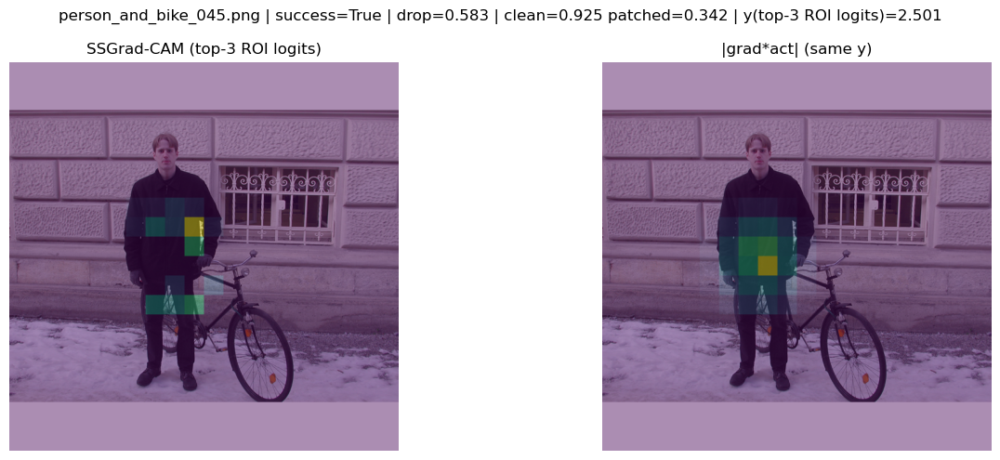

person_059.png | success=True | drop=0.849 | clean=0.913 patched=0.063 | y(top-3 ROI logits)=2.308


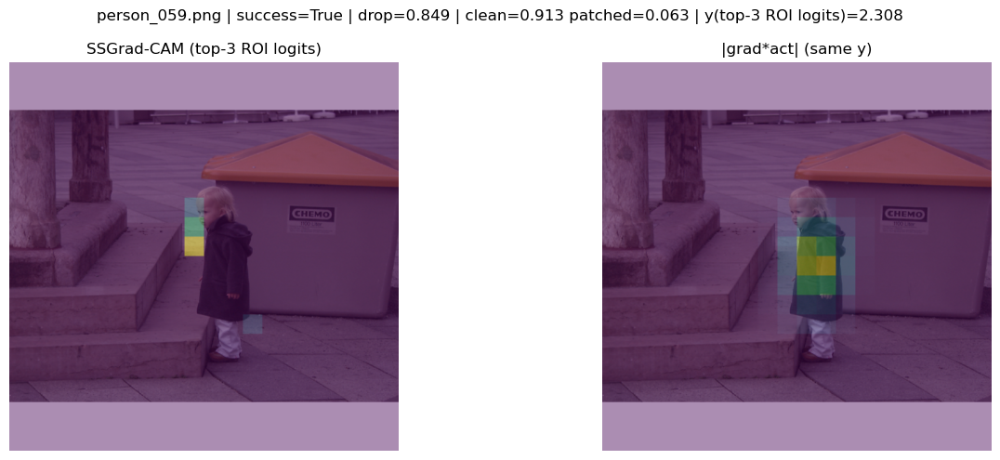

person_093.png | success=True | drop=0.482 | clean=0.932 patched=0.450 | y(top-3 ROI logits)=2.589


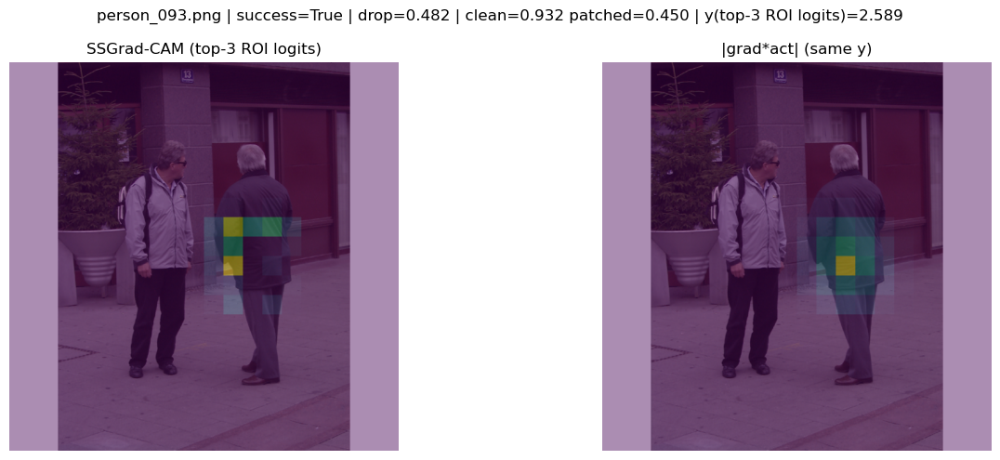

person_and_bike_149.png | success=True | drop=0.345 | clean=0.922 patched=0.578 | y(top-3 ROI logits)=2.434


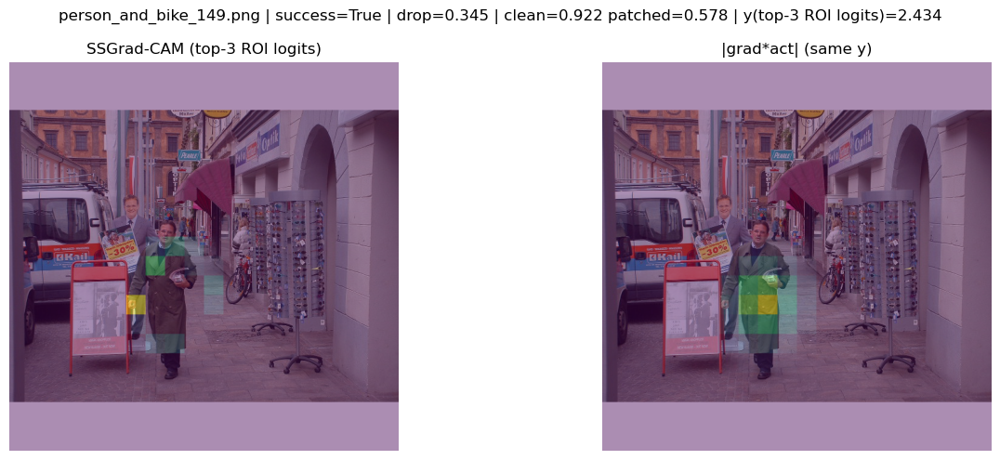

person_216.png | success=True | drop=0.698 | clean=0.933 patched=0.235 | y(top-3 ROI logits)=2.586


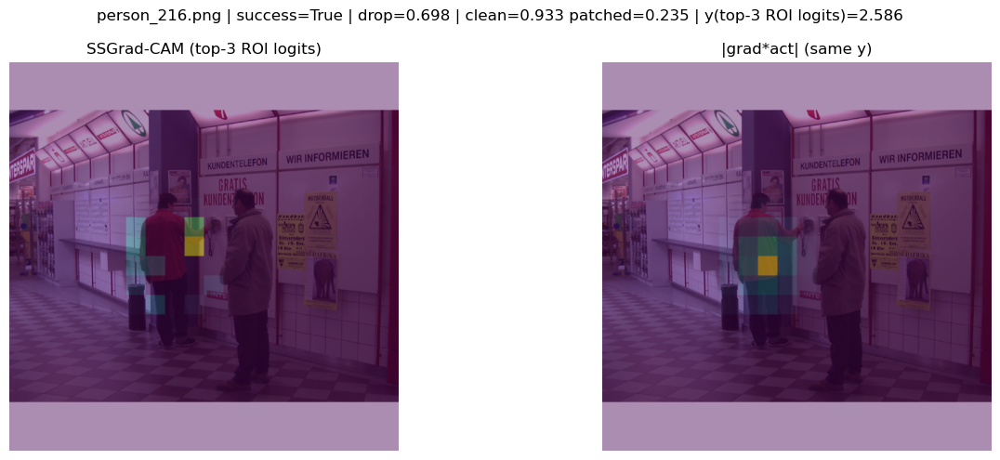

person_090.png | success=False | drop=0.109 | clean=0.915 patched=0.806 | y(top-3 ROI logits)=2.343


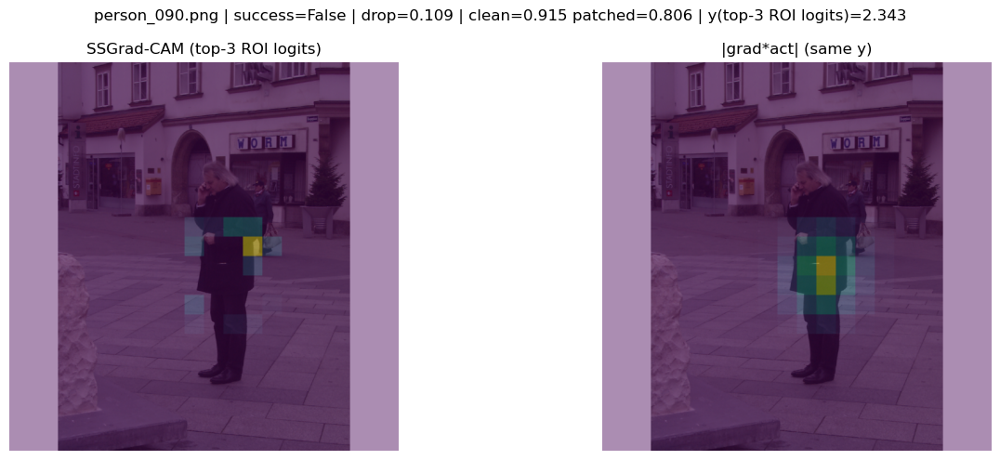

crop001573.png | success=False | drop=0.134 | clean=0.902 patched=0.768 | y(top-3 ROI logits)=2.002


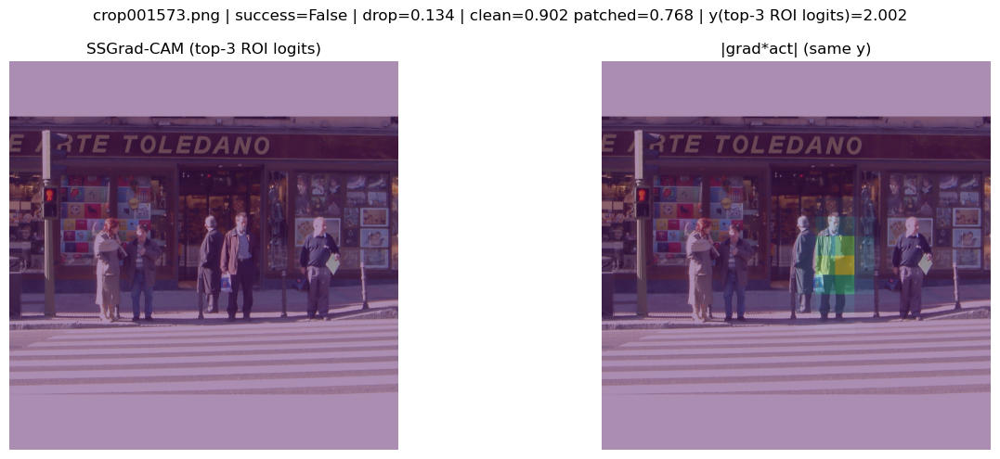

person_and_bike_089.png | success=False | drop=0.026 | clean=0.906 patched=0.881 | y(top-3 ROI logits)=2.268


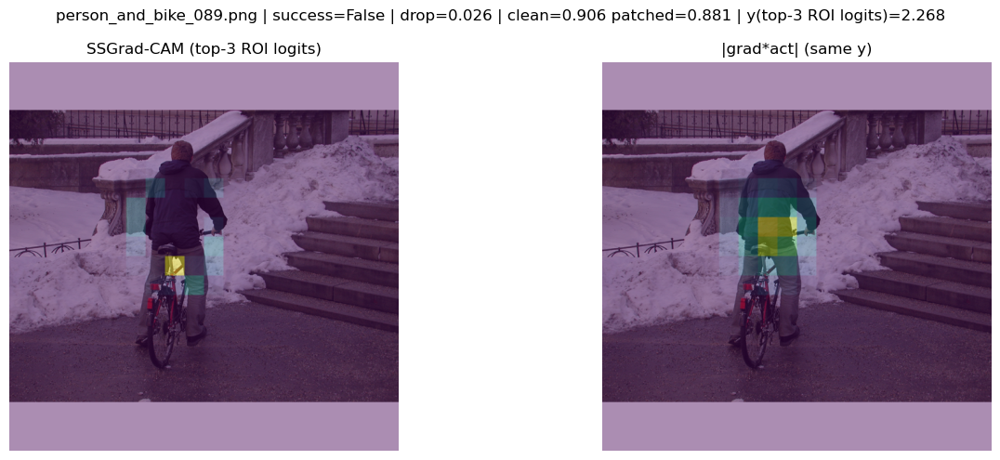

person_315.png | success=False | drop=0.016 | clean=0.899 patched=0.884 | y(top-3 ROI logits)=2.175


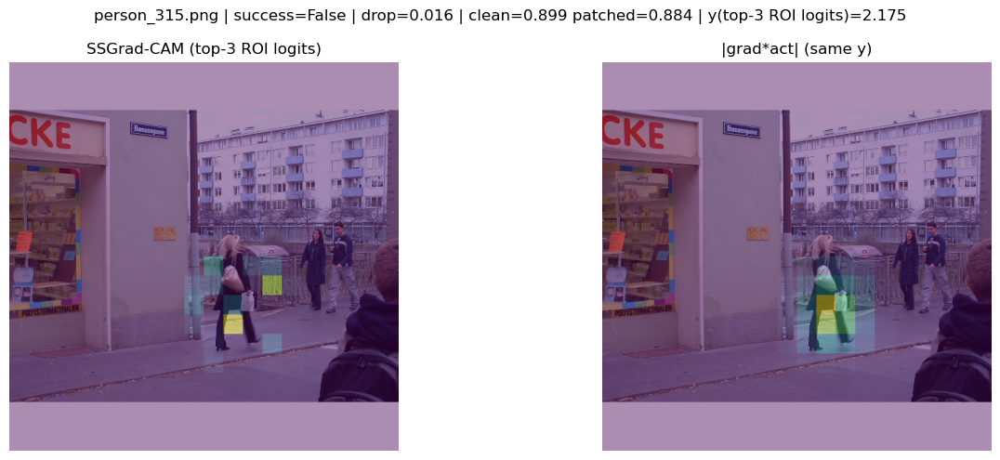

person_and_bike_077.png | success=False | drop=0.029 | clean=0.921 patched=0.892 | y(top-3 ROI logits)=2.395


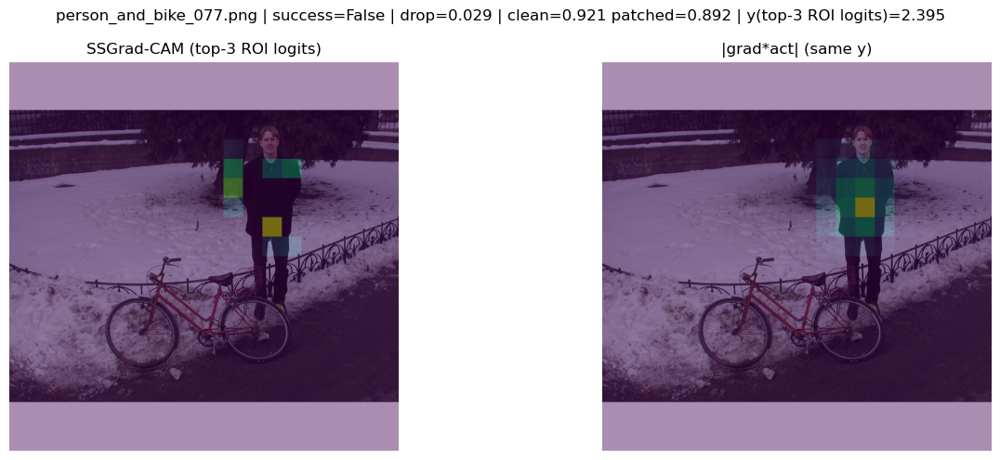

importance:   0%|          | 0/200 [00:00<?, ?it/s]

In [7]:
from tqdm.auto import tqdm
import numpy as np

# --- Minimal cell: visualize SSGrad-CAM (top-3 ROI logits) vs |grad*act| on model.22 ---
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from pathlib import Path
from typing import Dict, Any, Optional, Tuple

# -------------------
# Params (edit if needed)
# -------------------
TARGET_LAYER = "model.22"
NUM_EXAMPLES = 10          # total images shown (tries to split equally success/fail)
TOPK = 3                   # top-k ROI cells (rank by sigmoid, aggregate logits)
IMG_SIZE = int(CFG.imgsz)

# -------------------
# Helpers (minimal)
# -------------------
def _normalize_11hw(m_11hw: torch.Tensor, eps: float = 1e-12) -> torch.Tensor:
    # m: (1,1,h,w) -> [0,1]
    m = torch.nan_to_num(m_11hw, nan=0.0, posinf=0.0, neginf=0.0)
    m = m - m.amin(dim=(2, 3), keepdim=True)
    m = m / m.amax(dim=(2, 3), keepdim=True).clamp(min=eps)
    return m

def _roi_mask_on_grid(h: int, w: int, imgsz: int, bbox_xyxy: Tuple[float, float, float, float], device, dtype):
    # mark a cell as inside ROI if its center lies within bbox; return (1,h,w) binary
    x1, y1, x2, y2 = [float(v) for v in bbox_xyxy]
    stride_h = float(imgsz) / float(h)
    stride_w = float(imgsz) / float(w)
    stride = 0.5 * (stride_h + stride_w)

    ys = (torch.arange(h, device=device, dtype=dtype) + 0.5) * stride
    xs = (torch.arange(w, device=device, dtype=dtype) + 0.5) * stride
    yy, xx = torch.meshgrid(ys, xs, indexing="ij")
    m = (xx >= x1) & (xx <= x2) & (yy >= y1) & (yy <= y2)
    mask = m.to(dtype=dtype).unsqueeze(0)  # (1,h,w)

    # tiny bbox fallback: pick closest cell to bbox center
    if float(mask.sum().item()) < 1.0:
        cx, cy = 0.5 * (x1 + x2), 0.5 * (y1 + y2)
        d2 = (xx - cx) ** 2 + (yy - cy) ** 2
        ij = torch.argmin(d2)
        mask = torch.zeros_like(mask)
        mask.view(-1)[ij] = 1.0
    return mask  # (1,h,w)

def _detect_forward_train_levels(model_torch: nn.Module, x_bchw: torch.Tensor):
    # Force Detect head into train() so we avoid inference tensors in some Ultralytics builds.
    detect = get_module_by_name(model_torch, "model.23")
    was_detect_training = bool(detect.training)
    detect.train()
    try:
        out = model_torch(x_bchw)
    finally:
        if not was_detect_training:
            detect.eval()

    pred_levels = out
    if isinstance(out, (tuple, list)) and len(out) == 2 and isinstance(out[0], torch.Tensor):
        pred_levels = out[1]  # some builds return (pred, x)

    if not isinstance(pred_levels, (list, tuple)) or len(pred_levels) == 0:
        raise RuntimeError(f"Unexpected Detect output type: {type(pred_levels)}")

    reg_max = int(getattr(detect, "reg_max", 16))
    nc = int(getattr(detect, "nc", 80))
    return pred_levels, reg_max, nc

def _person_logit_map_from_level(t: torch.Tensor, reg_max: int, nc: int, target_class_id: int) -> torch.Tensor:
    # t: (B,C,h,w) -> (B,h,w) person logits
    cls_logits = t[:, reg_max * 4: reg_max * 4 + nc, :, :]
    return cls_logits[:, int(target_class_id), :, :]

def target_topk_roi_logits_scalar(
    model_torch: nn.Module,
    x_bchw: torch.Tensor,
    target_class_id: int,
    imgsz: int,
    bbox_xyxy: Tuple[float, float, float, float],
    topk: int = 3,
) -> torch.Tensor:
    """
    y = mean(logits of top-k ROI cells), where ranking is by sigmoid(prob) but aggregation is logits.
    """
    pred_levels, reg_max, nc = _detect_forward_train_levels(model_torch, x_bchw)

    all_logits = []
    all_probs = []

    for t in pred_levels:
        if not (isinstance(t, torch.Tensor) and t.ndim == 4):
            continue
        pl = _person_logit_map_from_level(t, reg_max, nc, target_class_id)  # (B,h,w)
        roi_bin = _roi_mask_on_grid(pl.shape[1], pl.shape[2], imgsz, bbox_xyxy, device=pl.device, dtype=pl.dtype)  # (1,h,w)
        mask = roi_bin[0].reshape(-1) > 0

        if mask.sum().item() < 1:
            continue

        lr = pl.reshape(pl.shape[0], -1)[:, mask]   # (B, n_roi)
        pr = lr.sigmoid()                           # (B, n_roi)
        all_logits.append(lr)
        all_probs.append(pr)

    if len(all_logits) == 0:
        raise RuntimeError("No ROI cells found across pred levels.")

    L = torch.cat(all_logits, dim=1)  # (B, total_roi)
    P = torch.cat(all_probs, dim=1)   # (B, total_roi)

    k = int(min(int(topk), P.shape[1]))
    idx = torch.topk(P, k=k, dim=1, largest=True, sorted=False).indices  # (B,k)
    chosen_logits = torch.gather(L, dim=1, index=idx)                    # (B,k)
    y = chosen_logits.mean(dim=1).mean()                                 # scalar
    return y

def layer_act_and_grad_for_y(
    model_torch: nn.Module,
    x_bchw: torch.Tensor,
    target_layer_name: str,
    y_fn,                       # callable(model_torch, x)->scalar tensor
) -> Tuple[torch.Tensor, torch.Tensor, float]:
    device = next(model_torch.parameters()).device
    dtype = next(model_torch.parameters()).dtype

    x = x_bchw.to(device=device, dtype=dtype)
    x.requires_grad_(True)

    layer = get_module_by_name(model_torch, target_layer_name)
    buf: Dict[str, torch.Tensor] = {}

    def _hook(_m, _inp, out):
        if isinstance(out, (list, tuple)):
            for o in out:
                if isinstance(o, torch.Tensor):
                    out = o
                    break
        if isinstance(out, torch.Tensor) and out.ndim == 4:
            buf["A"] = out
            try:
                out.retain_grad()
            except Exception:
                pass

            def _save_grad(g):
                if isinstance(g, torch.Tensor) and g.ndim == 4:
                    buf["G"] = g
                return g

            try:
                out.register_hook(_save_grad)
            except Exception:
                pass

    h = layer.register_forward_hook(_hook)
    was_training = bool(model_torch.training)

    try:
        model_torch.zero_grad(set_to_none=True)
        model_torch.train()  # keep autograd-friendly path

        y = y_fn(model_torch, x)
        y.backward()

        if "A" not in buf:
            raise RuntimeError("Failed to capture activation A.")
        if "G" not in buf:
            Ag = getattr(buf["A"], "grad", None)
            if isinstance(Ag, torch.Tensor) and Ag.ndim == 4:
                buf["G"] = Ag
            else:
                raise RuntimeError("Failed to capture gradient G.")

        A = buf["A"].detach().cpu().to(torch.float32)
        G = buf["G"].detach().cpu().to(torch.float32)
        return A, G, float(y.detach().cpu().item())

    finally:
        h.remove()
        if not was_training:
            model_torch.eval()
        x.requires_grad_(False)

def ssgradcam_raw(A_bchw: torch.Tensor, G_bchw: torch.Tensor, eps: float = 1e-12) -> torch.Tensor:
    """
    SSGrad-CAM (raw grid):
      w_k = GAP(G_k)
      S_k = |G_k| / max(|G_k|)
      cam = ReLU( sum_k (w_k * A_k) ∘ S_k )
    Returns: (1,1,h,w) normalized to [0,1]
    """
    w = G_bchw.mean(dim=(2, 3), keepdim=True)                 # (1,C,1,1)
    S = G_bchw.abs()
    S = S / S.amax(dim=(2, 3), keepdim=True).clamp(min=eps)   # (1,C,h,w)
    cam = ((w * A_bchw) * S).sum(dim=1, keepdim=True)         # (1,1,h,w)
    cam = F.relu(cam)
    return _normalize_11hw(cam, eps=eps)

def gradxact_raw(A_bchw: torch.Tensor, G_bchw: torch.Tensor, eps: float = 1e-12) -> torch.Tensor:
    # |grad * act| energy map on the same grid: (1,1,h,w) in [0,1]
    m = (G_bchw * A_bchw).abs().sum(dim=1, keepdim=True)
    return _normalize_11hw(m, eps=eps)

def _overlay_pair(pil_img, m1_11hw, m2_11hw, title1, title2, suptitle="", imgsz=640):
    img = np.asarray(pil_img.convert("RGB"))

    def up(h):
        return F.interpolate(h.detach().cpu(), size=(imgsz, imgsz), mode="nearest")[0, 0].numpy()

    h1 = up(m1_11hw)
    h2 = up(m2_11hw)

    plt.figure(figsize=(14, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.imshow(h1, alpha=0.45, vmin=0.0, vmax=1.0)
    plt.title(title1)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.imshow(h2, alpha=0.45, vmin=0.0, vmax=1.0)
    plt.title(title2)
    plt.axis("off")

    if suptitle:
        plt.suptitle(suptitle)

    plt.tight_layout()
    plt.show()

# -------------------
# Pick balanced examples (equal successes & fails)
# -------------------
succ = [d for d in run_data if bool(d.get("success", False))]
fail = [d for d in run_data if not bool(d.get("success", False))]

n_each = max(1, NUM_EXAMPLES // 2)
n_each = min(n_each, len(succ), len(fail))
examples = succ[:n_each] + fail[:n_each]

print(f"[info] Using {len(examples)} examples: success={n_each}, fail={n_each}")

# -------------------
# Run + plot
# -------------------
for d in examples:
    gcinfo = d.get("gradcam_info", {})
    bbox = gcinfo.get("picked_bbox", None)
    if bbox is None:
        print("[skip] no picked_bbox for", d.get("path", "<?>"))
        continue

    x_clean = torch_preprocess_letterboxed(d["clean_lb"], device=CFG.device, dtype=_MODEL_DTYPE)

    def _y_fn(model, x):
        return target_topk_roi_logits_scalar(
            model, x,
            target_class_id=int(target_class_id),
            imgsz=int(IMG_SIZE),
            bbox_xyxy=tuple(float(v) for v in bbox),
            topk=int(TOPK),
        )

    A, G, y = layer_act_and_grad_for_y(model_torch, x_clean, TARGET_LAYER, _y_fn)

    ssg = ssgradcam_raw(A, G)
    gxa = gradxact_raw(A, G)

    title = (
        f"{Path(d['path']).name} | success={bool(d['success'])} | drop={float(d['drop']):.3f} | "
        f"clean={float(d['conf_clean']):.3f} patched={float(d['conf_patch']):.3f} | y(top-{TOPK} ROI logits)={y:.3f}"
    )
    print(title)

    _overlay_pair(
        d["clean_lb"],
        ssg, gxa,
        title1=f"SSGrad-CAM (top-{TOPK} ROI logits)",
        title2="|grad*act| (same y)",
        suptitle=title,
        imgsz=int(IMG_SIZE),
    )

def compute_importance_tensors_for_all(
    run_data,
    model_torch,
    target_layer: str,
    target_class_id: int,
    imgsz: int,
    topk_roi: int = 3,
    force_recompute: bool = False,
):
    """
    Для каждого примера (clean) считаем и сохраняем:
      - imp_ssgrad_hw : (H,W) float32  [0..1]
      - imp_gxa_hw    : (H,W) float32  [0..1]  (channel-summed |grad*act|)
      - imp_gxa_chw   : (C,H,W) float32 >=0    (per-channel |grad*act|)
      - imp_y_clean   : float (твоя ROI-целевая функция)
    """
    for d in tqdm(run_data, desc="importance", total=len(run_data)):
        if (not force_recompute) and ("imp_gxa_chw" in d) and ("imp_ssgrad_hw" in d):
            continue

        gcinfo = d.get("gradcam_info", {})
        bbox = gcinfo.get("picked_bbox", None) if isinstance(gcinfo, dict) else None
        if bbox is None:
            d["imp_ssgrad_hw"] = None
            d["imp_gxa_hw"] = None
            d["imp_gxa_chw"] = None
            d["imp_y_clean"] = float("nan")
            continue

        x_clean = torch_preprocess_letterboxed(d["clean_lb"], device=CFG.device, dtype=_MODEL_DTYPE)

        def _y_fn(model, x):
            return target_topk_roi_logits_scalar(
                model, x,
                target_class_id=int(target_class_id),
                imgsz=int(imgsz),
                bbox_xyxy=tuple(float(v) for v in bbox),
                topk=int(topk_roi),
            )

        A, G, y = layer_act_and_grad_for_y(model_torch, x_clean, target_layer, _y_fn)  # (1,C,H,W)

        # SSGrad: (1,1,H,W) in [0,1]
        ssg_11hw = ssgradcam_raw(A, G)
        # grad*act HxW: (1,1,H,W) in [0,1]
        gxa_11hw = gradxact_raw(A, G)

        # grad*act full: (C,H,W) >= 0
        gxa_chw = (G[0] * A[0]).abs().to(torch.float32)

        d["imp_ssgrad_hw"] = ssg_11hw[0, 0].numpy().astype(np.float32)
        d["imp_gxa_hw"] = gxa_11hw[0, 0].numpy().astype(np.float32)
        d["imp_gxa_chw"] = gxa_chw.numpy().astype(np.float32)
        d["imp_G_chw"] = G[0].numpy().astype(np.float32)  # save clean gradient for sign-quadrant plots
        d["imp_y_clean"] = float(y)

# запуск
compute_importance_tensors_for_all(
    run_data=run_data,
    model_torch=model_torch,
    target_layer="model.22",
    target_class_id=int(target_class_id),
    imgsz=int(CFG.imgsz),
    topk_roi=3,
    force_recompute=False,
)

In [8]:
# -------------------
# Pick balanced examples (equal successes & fails)
# -------------------
NUM_EXAMPLES = 200

succ = [d for d in run_data if bool(d.get("success", False))]
fail = [d for d in run_data if not bool(d.get("success", False))]

n_each = max(1, NUM_EXAMPLES // 2)
n_each = min(n_each, len(succ), len(fail))
examples = succ[:n_each] + fail[:n_each]

print(f"[info] Using {len(examples)} examples: success={n_each}, fail={n_each}")

[info] Using 200 examples: success=100, fail=100


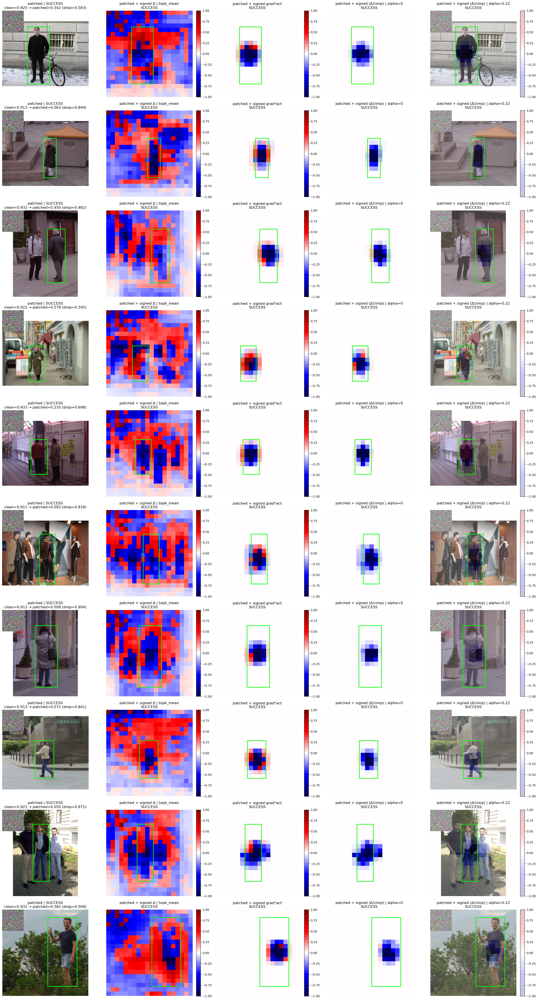

In [9]:
# --- Δ overlays + grad*act + weighted(Δ⊙imp) with 5 columns ---
# Cols:
# 1) patched
# 2) patched + signed Δ (seismic, symmetric)
# 3) patched + signed grad*act (seismic, symmetric around 0)
# 4) patched + signed (Δ ⊙ importance) with alpha=0.0 (i.e., hidden overlay) + bbox
# 5) patched + signed (Δ ⊙ importance) with custom alpha ONLY for this column + bbox

from pathlib import Path
from typing import Any, Dict, List
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt


def _robust_norm_signed(x: np.ndarray, q: float = 99.0, eps: float = 1e-12):
    """Normalize to [-1,1] using symmetric robust scale based on q-th percentile of |x|."""
    x = np.asarray(x, dtype=np.float32)
    s = float(np.percentile(np.abs(x[np.isfinite(x)]), q)) if np.isfinite(x).any() else 1.0
    s = max(s, eps)
    return np.clip(x / s, -1.0, 1.0), s


def _reduce_channels(t_chw: torch.Tensor, mode: str = "topk_mean", topk: int = 32) -> torch.Tensor:
    """
    Reduce (C,H,W) -> (H,W).
    Expected to exist in your notebook already; kept here for safety.
    Modes used in this cell:
      - "l2": sqrt(mean_c x^2)
      - "abs_mean": mean_c |x|
      - "topk_mean": mean of top-k |x| across channels (signed by mean sign per pixel)
      - "topk_sum": sum of top-k |x| across channels (signed by mean sign per pixel)
    """
    if t_chw.ndim != 3:
        raise ValueError(f"_reduce_channels expects (C,H,W), got {tuple(t_chw.shape)}")

    C, H, W = t_chw.shape
    if mode == "l2":
        return torch.sqrt(torch.mean(t_chw * t_chw, dim=0).clamp(min=0))
    if mode == "abs_mean":
        return torch.mean(t_chw.abs(), dim=0)

    # topk by magnitude across channels, but keep sign:
    # sign per (h,w) from mean over channels (robust enough for visualization)
    k = int(min(max(int(topk), 1), C))
    mag = t_chw.abs()  # (C,H,W)
    topv, _ = torch.topk(mag, k=k, dim=0, largest=True, sorted=False)  # (k,H,W)
    base = topv.mean(dim=0) if mode == "topk_mean" else topv.sum(dim=0)
    sgn = torch.sign(t_chw.mean(dim=0))  # (H,W)
    return base * sgn


def _draw_clean_bbox(ax, bbox_xyxy, success: bool):
    """Draw bbox (x1,y1,x2,y2) on axis; assumes image is 640x640."""
    if bbox_xyxy is None:
        return
    x1, y1, x2, y2 = [float(v) for v in bbox_xyxy]
    w = max(0.0, x2 - x1)
    h = max(0.0, y2 - y1)
    import matplotlib.patches as patches
    rect = patches.Rectangle(
        (x1, y1), w, h,
        linewidth=2.0,
        edgecolor=("lime" if success else "red"),
        facecolor="none",
    )
    ax.add_patch(rect)


def visualize_delta_maps_5cols(
    run_data: List[Dict[str, Any]],
    layer: str = "model.22",
    reduce_mode: str = "topk_mean",
    topk: int = 32,
    max_rows: int | None = None,
    alpha: float = 0.45,
    alpha_weighted: float = 0.25,   # ONLY for col 5
    save_dir: str | Path | None = None,
):
    """
    Per-row layout (5 columns):
      1) patched
      2) patched + signed Δ
      3) patched + signed grad*act (imp_gxa_hw, sign restored)
      4) patched + signed (Δ ⊙ importance), BUT alpha=0.0 (hidden)  [still draws bbox]
      5) patched + signed (Δ ⊙ importance) with alpha=alpha_weighted

    Requirements for `run_data` entries:
      - d["patch_lb"] or d["patched_lb"] or equivalent PIL image (letterboxed)
      - d["gradcam_info"]["picked_bbox"] for bbox overlay (optional)
      - d["success"], d["conf_clean"], d["conf_patch"], d["drop"]
      - d["deltas"][layer] as torch.Tensor (1,C,H,W) OR (C,H,W) (we handle both)
      - d["imp_gxa_hw"] as (H,W) float array in [0,1] (used for col 3, sign restored)
      - d["imp_gxa_chw"] as (C,H,W) float array >=0 (used for weighted product)
    """

    # choose subset
    rows = run_data if (max_rows is None) else run_data[: int(max_rows)]
    n = len(rows)
    if n == 0:
        print("[warn] No rows to visualize.")
        return

    fig, axes = plt.subplots(nrows=n, ncols=5, figsize=(25, 4.6 * n))
    if n == 1:
        axes = np.expand_dims(axes, axis=0)

    if save_dir is not None:
        save_dir = Path(save_dir)
        save_dir.mkdir(parents=True, exist_ok=True)

    for i, d in enumerate(rows):
        # ---- basic fields ----
        p = d.get("path", f"row{i}")
        success = bool(d.get("success", False))
        status = "SUCCESS" if success else "FAIL"
        conf_c = float(d.get("conf_clean", float("nan")))
        conf_p = float(d.get("conf_patch", float("nan")))
        drop = float(d.get("drop", float("nan")))

        gcinfo = d.get("gradcam_info", {}) if isinstance(d.get("gradcam_info", {}), dict) else {}
        bbox_xyxy = gcinfo.get("picked_bbox", None)

        # patched image (try a few common keys)
        patched_img = d.get("patch_lb", None)
        if patched_img is None:
            patched_img = d.get("patched_lb", None)
        if patched_img is None:
            patched_img = d.get("clean_lb", None)

        if patched_img is None:
            # nothing to draw
            for j in range(5):
                axes[i, j].set_axis_off()
                axes[i, j].set_title("missing image")
            continue

        img_np = np.asarray(patched_img.convert("RGB"))
        tgt_h, tgt_w = img_np.shape[0], img_np.shape[1]

        # delta (prefer stored torch tensor)
        delta = d.get("deltas", {}).get(layer, None)
        if delta is None:
            # still show image-only
            for j, title in enumerate(
                ["patched", "patched + signed Δ", "patched + signed grad*act", "patched + signed (Δ⊙imp) alpha=0", "patched + signed (Δ⊙imp)"]
            ):
                axes[i, j].imshow(img_np)
                _draw_clean_bbox(axes[i, j], bbox_xyxy, success)
                axes[i, j].set_title(title + " (missing Δ)")
                axes[i, j].axis("off")
            continue

        # normalize delta shape to (C,H,W) torch
        if isinstance(delta, torch.Tensor):
            if delta.ndim == 4:
                delta_chw = delta[0].detach().cpu()
            elif delta.ndim == 3:
                delta_chw = delta.detach().cpu()
            else:
                raise ValueError(f"Unexpected delta tensor shape: {tuple(delta.shape)}")
        else:
            # allow numpy
            delta_arr = np.asarray(delta)
            if delta_arr.ndim == 4:
                delta_arr = delta_arr[0]
            if delta_arr.ndim != 3:
                raise ValueError(f"Unexpected delta array shape: {tuple(delta_arr.shape)}")
            delta_chw = torch.as_tensor(delta_arr, dtype=torch.float32)

        C, H, W = tuple(delta_chw.shape)

        # --- signed Δ map (H,W) then upsample ---
        signed_hw_t = _reduce_channels(delta_chw.float(), mode=reduce_mode, topk=topk)  # (H,W) signed
        if tuple(signed_hw_t.shape) != (tgt_h, tgt_w):
            signed_hw_t = F.interpolate(signed_hw_t[None, None, ...], size=(tgt_h, tgt_w), mode="nearest")[0, 0]
        signed_hw = signed_hw_t.numpy()
        signed_n, _ = _robust_norm_signed(signed_hw, q=99.0)

        # --- signed grad*act map from imp_gxa_hw (H,W in [0,1]) ---
        gxa_hw = d.get("imp_gxa_hw", None)
        if gxa_hw is not None:
            gxa_hw_t = torch.as_tensor(np.asarray(gxa_hw), dtype=torch.float32)
            # restore sign from Δ map (same grid) BEFORE upsampling
            sign_hw_small = torch.sign(_reduce_channels(delta_chw.float(), mode=reduce_mode, topk=topk))
            # align shapes (should already be H,W)
            if tuple(gxa_hw_t.shape) != tuple(sign_hw_small.shape):
                raise ValueError(f"imp_gxa_hw shape {tuple(gxa_hw_t.shape)} != sign_hw shape {tuple(sign_hw_small.shape)}")
            gxa_signed_small = gxa_hw_t * sign_hw_small  # signed grad*act proxy
            if tuple(gxa_signed_small.shape) != (tgt_h, tgt_w):
                gxa_signed_up = F.interpolate(gxa_signed_small[None, None, ...], size=(tgt_h, tgt_w), mode="nearest")[0, 0]
            else:
                gxa_signed_up = gxa_signed_small
            gxa_signed = gxa_signed_up.numpy()
            gxa_n, _ = _robust_norm_signed(gxa_signed, q=99.0)
        else:
            gxa_n = None

        # --- signed (Δ ⊙ importance) computed on full (C,H,W) ---
        imp_chw = d.get("imp_gxa_chw", None)
        if imp_chw is not None:
            imp_chw_t = torch.as_tensor(np.asarray(imp_chw), dtype=torch.float32)
            if tuple(imp_chw_t.shape) != tuple(delta_chw.shape):
                raise ValueError(f"imp_gxa_chw shape {tuple(imp_chw_t.shape)} != delta_chw shape {tuple(delta_chw.shape)}")

            weighted_chw = delta_chw.float() * imp_chw_t  # KEEP SIGN ✅
            weighted_hw_t = _reduce_channels(weighted_chw, mode=reduce_mode, topk=topk).detach().cpu()  # signed (H,W)

            if tuple(weighted_hw_t.shape) != (tgt_h, tgt_w):
                weighted_hw_t = F.interpolate(weighted_hw_t[None, None, ...], size=(tgt_h, tgt_w), mode="nearest")[0, 0]
            weighted_hw = weighted_hw_t.numpy()
            weighted_n, _ = _robust_norm_signed(weighted_hw, q=99.0)
        else:
            weighted_n = None

        # -------------------------
        # Plot: 5 columns
        # -------------------------
        # Col 1: patched
        axes[i, 0].imshow(img_np)
        _draw_clean_bbox(axes[i, 0], bbox_xyxy, success)
        axes[i, 0].set_title(f"patched | {status}\nclean={conf_c:.3f} → patched={conf_p:.3f} (drop={drop:.3f})")
        axes[i, 0].axis("off")

        # Col 2: signed Δ
        axes[i, 1].imshow(img_np)
        _draw_clean_bbox(axes[i, 1], bbox_xyxy, success)
        im2 = axes[i, 1].imshow(signed_n, vmin=-1, vmax=1, cmap="seismic", alpha=alpha)
        axes[i, 1].set_title(f"patched + signed Δ | {reduce_mode}\n{status}")
        axes[i, 1].axis("off")
        plt.colorbar(im2, ax=axes[i, 1], fraction=0.046, pad=0.04)

        # Col 3: signed grad*act
        axes[i, 2].imshow(img_np)
        _draw_clean_bbox(axes[i, 2], bbox_xyxy, success)
        if gxa_n is None:
            axes[i, 2].set_title("patched + signed grad*act (missing)")
        else:
            im3 = axes[i, 2].imshow(gxa_n, vmin=-1, vmax=1, cmap="seismic", alpha=alpha)
            axes[i, 2].set_title(f"patched + signed grad*act\n{status}")
            plt.colorbar(im3, ax=axes[i, 2], fraction=0.046, pad=0.04)
        axes[i, 2].axis("off")

        # Col 4: signed (Δ⊙imp) alpha=0.0
        axes[i, 3].imshow(img_np)
        _draw_clean_bbox(axes[i, 3], bbox_xyxy, success)
        if weighted_n is None:
            axes[i, 3].set_title("patched + signed (Δ⊙imp) (missing) | alpha=0")
        else:
            axes[i, 3].imshow(weighted_n, vmin=-1, vmax=1, cmap="seismic", alpha=1.0)  # alpha=0 ✅
            axes[i, 3].set_title(f"patched + signed (Δ⊙imp) | alpha=0\n{status}")
        axes[i, 3].axis("off")

        # Col 5: signed (Δ⊙imp) custom alpha
        axes[i, 4].imshow(img_np)
        _draw_clean_bbox(axes[i, 4], bbox_xyxy, success)
        if weighted_n is None:
            axes[i, 4].set_title("patched + signed (Δ⊙imp) (missing)")
        else:
            im5 = axes[i, 4].imshow(weighted_n, vmin=-1, vmax=1, cmap="seismic", alpha=float(alpha_weighted))
            axes[i, 4].set_title(f"patched + signed (Δ⊙imp) | alpha={alpha_weighted:g}\n{status}")
            plt.colorbar(im5, ax=axes[i, 4], fraction=0.046, pad=0.04)
        axes[i, 4].axis("off")

        # Row label
        axes[i, 0].set_ylabel(
            f"{Path(str(p)).name}\n{status} | clean={conf_c:.3f} patched={conf_p:.3f} drop={drop:.3f}",
            rotation=0,
            labelpad=70,
            va="center",
        )

        # Optional save: save composite RGBs for cols 2/3/5 (col 4 is intentionally alpha=0)
        if save_dir is not None:
            stem = Path(str(p)).stem
            base = img_np.astype(np.float32) / 255.0

            def _save_signed_overlay(arr_n, out_path: Path, a: float):
                cmap = plt.get_cmap("seismic")
                rgba = cmap((arr_n + 1.0) * 0.5)
                comp = (1 - a) * base + a * rgba[..., :3]
                comp = np.clip(comp, 0.0, 1.0)
                plt.imsave(out_path, comp)

            out2 = save_dir / f"{stem}__overlay_signedDelta_{reduce_mode}.png"
            _save_signed_overlay(signed_n, out2, float(alpha))

            if gxa_n is not None:
                out3 = save_dir / f"{stem}__overlay_signedGradAct.png"
                _save_signed_overlay(gxa_n, out3, float(alpha))

            if weighted_n is not None:
                out5 = save_dir / f"{stem}__overlay_signedWeighted_{reduce_mode}_a{alpha_weighted:g}.png"
                _save_signed_overlay(weighted_n, out5, float(alpha_weighted))

    plt.tight_layout()
    plt.show()


# Example call:
visualize_delta_maps_5cols(
     run_data=examples,          # or run_data
     layer="model.22",
     reduce_mode="topk_mean",
     topk=32,
     max_rows=10,
     alpha=1,
     alpha_weighted=0.22,
     save_dir=None,
 )

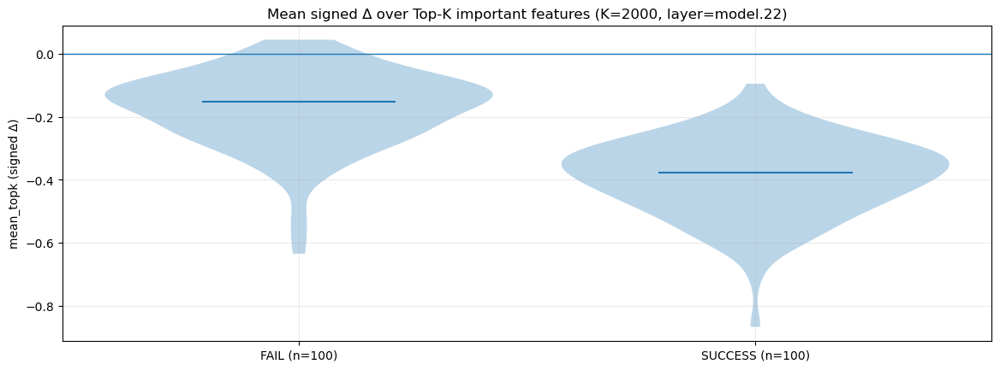

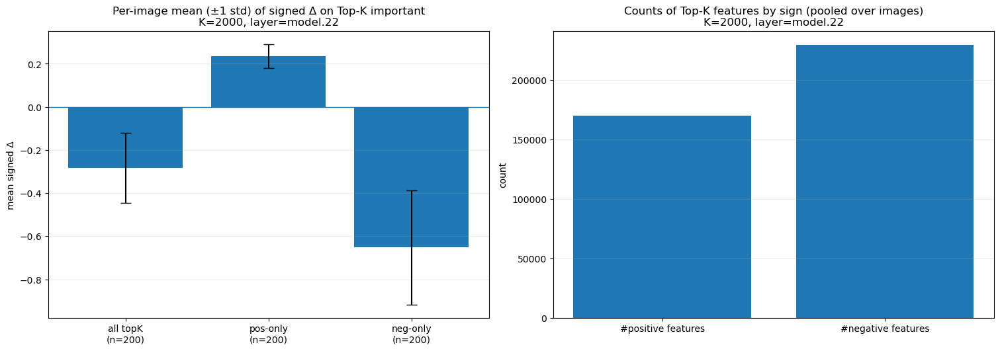

In [10]:
# --- Top-K important features: sign statistics (importance=imp_gxa_chw, sign from Δ) ---

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

LAYER = "model.22"
K = 2000

def per_image_topk_sign_stats(run_data, layer=LAYER, k=K, imp_key="imp_gxa_chw", deltas_key="deltas"):
    rows = []
    for d in run_data:
        imp = d.get(imp_key, None)
        delta = d.get(deltas_key, {}).get(layer, None)

        if imp is None or delta is None:
            rows.append({"success": bool(d.get("success", False)), "mean_topk": np.nan, "std_topk": np.nan,
                         "n_pos": 0, "n_neg": 0, "mean_pos": np.nan, "std_pos": np.nan, "mean_neg": np.nan, "std_neg": np.nan})
            continue

        # delta -> (C,H,W) torch on CPU
        if isinstance(delta, torch.Tensor):
            d_chw = delta[0].detach().cpu().float() if delta.ndim == 4 else delta.detach().cpu().float()
        else:
            arr = np.asarray(delta)
            if arr.ndim == 4: arr = arr[0]
            d_chw = torch.as_tensor(arr, dtype=torch.float32)

        imp_flat = np.asarray(imp, dtype=np.float32).reshape(-1)
        d_flat = d_chw.reshape(-1).numpy().astype(np.float32)

        m = np.isfinite(imp_flat) & np.isfinite(d_flat)
        imp_m = imp_flat[m]
        d_m = d_flat[m]
        if imp_m.size == 0:
            rows.append({"success": bool(d.get("success", False)), "mean_topk": np.nan, "std_topk": np.nan,
                         "n_pos": 0, "n_neg": 0, "mean_pos": np.nan, "std_pos": np.nan, "mean_neg": np.nan, "std_neg": np.nan})
            continue

        k_eff = int(min(max(int(k), 1), imp_m.size))
        idx = np.argpartition(imp_m, -k_eff)[-k_eff:]     # Top-K by importance
        chosen = d_m[idx]                                  # signed Δ at those important positions

        pos = chosen[chosen > 0]
        neg = chosen[chosen < 0]

        rows.append({
            "success": bool(d.get("success", False)),
            "mean_topk": float(np.mean(chosen)),
            "std_topk": float(np.std(chosen)),
            "n_pos": int(pos.size),
            "n_neg": int(neg.size),
            "mean_pos": float(np.mean(pos)) if pos.size else np.nan,
            "std_pos": float(np.std(pos)) if pos.size else np.nan,
            "mean_neg": float(np.mean(neg)) if neg.size else np.nan,
            "std_neg": float(np.std(neg)) if neg.size else np.nan,
        })
    return pd.DataFrame(rows)

sign_df = per_image_topk_sign_stats(run_data, layer=LAYER, k=K)

# 1) Распределение mean_topk (по картинкам), отдельно success/fail
succ = sign_df[sign_df.success == True]["mean_topk"].to_numpy(dtype=float)
fail = sign_df[sign_df.success == False]["mean_topk"].to_numpy(dtype=float)
succ = succ[np.isfinite(succ)]
fail = fail[np.isfinite(fail)]

plt.figure(figsize=(14, 4.8))
data, pos, labels = [], [], []
if fail.size:
    data.append(fail); pos.append(1); labels.append(f"FAIL (n={fail.size})")
if succ.size:
    data.append(succ); pos.append(2 if fail.size else 1); labels.append(f"SUCCESS (n={succ.size})")

if data:
    plt.violinplot(data, positions=pos, widths=0.85, showmeans=False, showmedians=True, showextrema=False)
    plt.xticks(pos, labels)
    plt.axhline(0.0, linewidth=1)
    plt.grid(True, alpha=0.25)
    plt.title(f"Mean signed Δ over Top-K important features (K={K}, layer={LAYER})")
    plt.ylabel("mean_topk (signed Δ)")
plt.show()

# 2) Сводка: среднее ± std по картинкам для mean_topk / mean_pos / mean_neg + количество pos/neg фич
def _mean_std(x):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size == 0: return np.nan, np.nan, 0
    return float(np.mean(x)), float(np.std(x)), int(x.size)

m_all, s_all, n_all = _mean_std(sign_df["mean_topk"].to_numpy())
m_pos, s_pos, n_pos = _mean_std(sign_df["mean_pos"].to_numpy())
m_neg, s_neg, n_neg = _mean_std(sign_df["mean_neg"].to_numpy())

cnt_pos = int(np.nansum(sign_df["n_pos"].to_numpy(dtype=float)))
cnt_neg = int(np.nansum(sign_df["n_neg"].to_numpy(dtype=float)))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5.2), constrained_layout=True)

x = np.arange(3)
y = [m_all, m_pos, m_neg]
yerr = [s_all, s_pos, s_neg]
ax1.bar(x, y, yerr=yerr, capsize=6)
ax1.axhline(0.0, linewidth=1)
ax1.set_xticks(x)
ax1.set_xticklabels([f"all topK\n(n={n_all})", f"pos-only\n(n={n_pos})", f"neg-only\n(n={n_neg})"])
ax1.set_title(f"Per-image mean (±1 std) of signed Δ on Top-K important\nK={K}, layer={LAYER}")
ax1.set_ylabel("mean signed Δ")
ax1.grid(True, axis="y", alpha=0.25)

ax2.bar([0, 1], [cnt_pos, cnt_neg])
ax2.set_xticks([0, 1])
ax2.set_xticklabels(["#positive features", "#negative features"])
ax2.set_title(f"Counts of Top-K features by sign (pooled over images)\nK={K}, layer={LAYER}")
ax2.set_ylabel("count")
ax2.grid(True, axis="y", alpha=0.25)

plt.show()

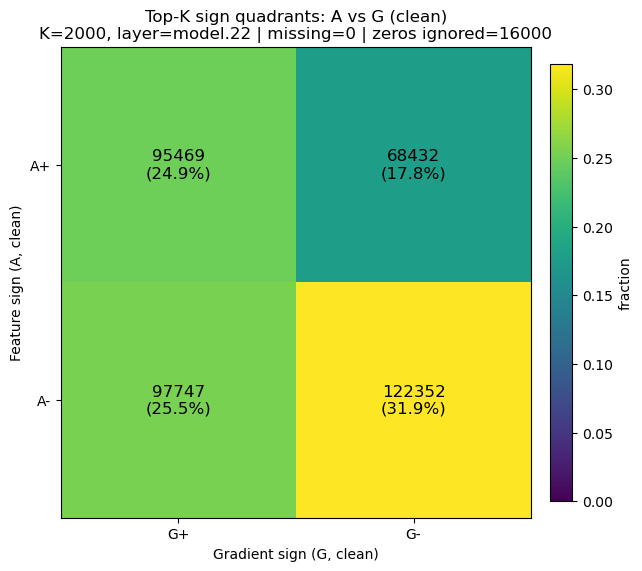

Counts [[A+G+, A+G-], [A-G+, A-G-]] =
 [[ 95469  68432]
 [ 97747 122352]]


In [11]:
import numpy as np
import matplotlib.pyplot as plt
import torch

LAYER_Q = "model.22"
K_Q = 2000


def quadrant_counts_A_vs_G(run_data, layer=LAYER_Q, k=K_Q,
                           imp_key="imp_gxa_chw",
                           acts_key="acts_clean",
                           grad_key="imp_G_chw"):
    # rows: A+ then A- ; cols: G+ then G-
    counts = np.zeros((2, 2), dtype=np.int64)
    ignored_missing = 0
    ignored_zero = 0

    for d in run_data:
        imp = d.get(imp_key, None)
        G = d.get(grad_key, None)
        acts = d.get(acts_key, {}) if isinstance(d.get(acts_key, {}), dict) else {}
        A = acts.get(layer, None)

        if imp is None or G is None or A is None:
            ignored_missing += 1
            continue

        # A: torch tensor from capture_activations_for_layers: (1,C,H,W)
        if isinstance(A, torch.Tensor):
            if A.ndim == 4:
                A_chw = A[0].detach().cpu().numpy().astype(np.float32)
            elif A.ndim == 3:
                A_chw = A.detach().cpu().numpy().astype(np.float32)
            else:
                ignored_missing += 1
                continue
        else:
            arr = np.asarray(A)
            if arr.ndim == 4:
                arr = arr[0]
            if arr.ndim != 3:
                ignored_missing += 1
                continue
            A_chw = arr.astype(np.float32)

        imp_flat = np.asarray(imp, dtype=np.float32).reshape(-1)
        g_flat = np.asarray(G, dtype=np.float32).reshape(-1)
        a_flat = np.asarray(A_chw, dtype=np.float32).reshape(-1)

        m = np.isfinite(imp_flat) & np.isfinite(g_flat) & np.isfinite(a_flat)
        if m.sum() == 0:
            continue

        imp_m = imp_flat[m]
        g_m = g_flat[m]
        a_m = a_flat[m]

        k_eff = int(min(max(int(k), 1), imp_m.size))
        idx = np.argpartition(imp_m, -k_eff)[-k_eff:]

        gk = g_m[idx]
        ak = a_m[idx]

        sg = np.sign(gk)
        sa = np.sign(ak)

        nz = (sg != 0) & (sa != 0)
        ignored_zero += int((~nz).sum())
        sg = sg[nz]
        sa = sa[nz]

        if sg.size == 0:
            continue

        # row 0 for A+, 1 for A-
        row = (sa < 0).astype(np.int64)
        # col 0 for G+, 1 for G-
        col = (sg < 0).astype(np.int64)

        bins = 2 * row + col
        bc = np.bincount(bins, minlength=4)
        counts[0, 0] += bc[0]  # A+G+
        counts[0, 1] += bc[1]  # A+G-
        counts[1, 0] += bc[2]  # A-G+
        counts[1, 1] += bc[3]  # A-G-

    total = counts.sum()
    frac = counts / total if total > 0 else counts.astype(np.float64)
    return counts, frac, ignored_missing, ignored_zero


counts_q, frac_q, n_miss, n_zero = quadrant_counts_A_vs_G(run_data, layer=LAYER_Q, k=K_Q)

fig, ax = plt.subplots(1, 1, figsize=(6.2, 5.6), constrained_layout=True)
vmax = float(np.max(frac_q)) if np.isfinite(frac_q).any() else 1.0
im = ax.imshow(frac_q, vmin=0.0, vmax=vmax)

ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(["G+", "G-"])
ax.set_yticklabels(["A+", "A-"])
ax.set_xlabel("Gradient sign (G, clean)")
ax.set_ylabel("Feature sign (A, clean)")
ax.set_title(f"Top-K sign quadrants: A vs G (clean)\nK={K_Q}, layer={LAYER_Q} | missing={n_miss} | zeros ignored={n_zero}")

for r in range(2):
    for c in range(2):
        pct = 100.0 * float(frac_q[r, c]) if counts_q.sum() > 0 else 0.0
        ax.text(c, r, f"{counts_q[r, c]}\n({pct:.1f}%)", ha="center", va="center", fontsize=12)

plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="fraction")
plt.show()

print("Counts [[A+G+, A+G-], [A-G+, A-G-]] =\n", counts_q)


,path,name,success,drop,y_clean,y_patch,cos_hw,pearson_hw,jacc_hw_topk,l1prob_hw,cos_chw,pearson_chw,jacc_chw_topk,l1prob_chw
0,successful_examples/person_and_bike_045.png,person_and_bike_045.png,True,0.583320,2.500741,-0.836105,0.856363,0.849529,1.0,0.644525,0.290728,0.287554,0.199760,1.314498
1,unsuccessful_examples/person_090.png,person_090.png,False,0.109086,2.343405,1.396926,0.892993,0.888222,1.0,0.532623,0.584761,0.582750,0.297438,1.004339
2,successful_examples/person_059.png,person_059.png,True,0.849170,2.307974,-6.743661,0.357668,0.318666,1.0,1.366736,0.064600,0.058246,0.058481,1.681885
3,successful_examples/person_093.png,person_093.png,True,0.482483,2.588968,-0.293658,0.858865,0.852261,1.0,0.584479,0.320850,0.317902,0.233806,1.221101
4,successful_examples/person_and_bike_149.png,person_and_bike_149.png,True,0.344625,2.433527,0.230356,0.944300,0.942070,1.0,0.430251,0.284610,0.282241,0.264223,1.224766


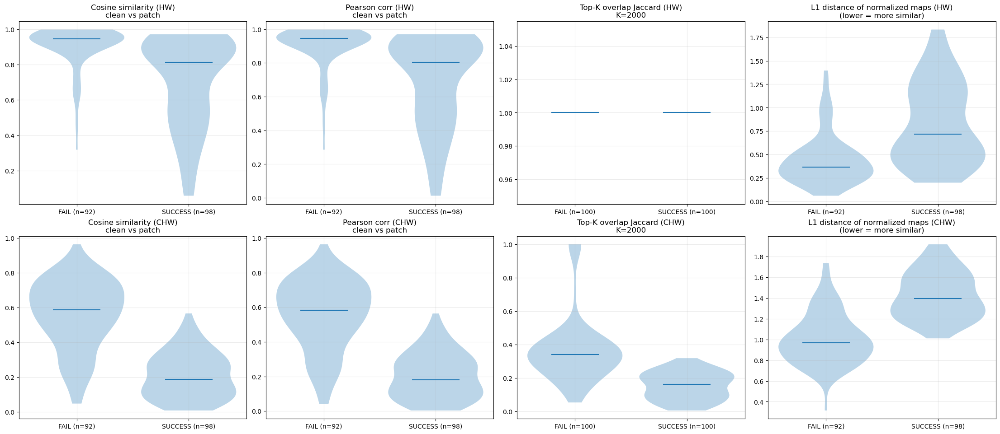

In [12]:
# --- How much do importance maps change under patch? (success vs fail) ---
# Compute |grad*act| importance on BOTH clean and patched images (same ROI target y),
# then compare clean vs patch maps with similarity/overlap metrics.

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from sklearn.metrics import roc_auc_score

TARGET_LAYER_IMP = "model.22"
TOPK_ROI_IMP = 3
K_TOP = 2000
IMG_SIZE = int(CFG.imgsz)


def _flatten_finite(a, b):
    a = np.asarray(a, dtype=np.float32).reshape(-1)
    b = np.asarray(b, dtype=np.float32).reshape(-1)
    m = np.isfinite(a) & np.isfinite(b)
    return a[m], b[m]


def cosine_sim(a, b):
    a, b = _flatten_finite(a, b)
    if a.size < 2:
        return float("nan")
    na = float(np.linalg.norm(a))
    nb = float(np.linalg.norm(b))
    if na == 0.0 or nb == 0.0:
        return float("nan")
    return float(np.dot(a, b) / (na * nb))


def pearson_corr(a, b):
    a, b = _flatten_finite(a, b)
    if a.size < 3:
        return float("nan")
    sa = float(a.std())
    sb = float(b.std())
    if sa == 0.0 or sb == 0.0:
        return float("nan")
    return float(np.corrcoef(a, b)[0, 1])


def topk_jaccard(a, b, k):
    a, b = _flatten_finite(a, b)
    if a.size == 0:
        return float("nan")
    k_eff = int(min(max(int(k), 1), a.size))
    ia = np.argpartition(a, -k_eff)[-k_eff:]
    ib = np.argpartition(b, -k_eff)[-k_eff:]
    sa = set(map(int, ia))
    sb = set(map(int, ib))
    inter = len(sa & sb)
    union = len(sa | sb)
    return float(inter / union) if union else float("nan")


def l1prob_dist(a, b, eps=1e-12):
    # compare maps as probability distributions (normalize to sum=1)
    a, b = _flatten_finite(a, b)
    if a.size == 0:
        return float("nan")
    a = np.clip(a, 0.0, None)
    b = np.clip(b, 0.0, None)
    sa = float(a.sum())
    sb = float(b.sum())
    if sa < eps or sb < eps:
        return float("nan")
    pa = a / sa
    pb = b / sb
    return float(np.abs(pa - pb).sum())


def compute_imp_variant(d, variant: str):
    """
    Compute and store importance for one example and variant in {'clean','patch'}:
      - imp_gxa_hw__{variant} : (H,W) in [0,1]
      - imp_gxa_chw__{variant}: (C,H,W) >=0
      - imp_y__{variant}      : scalar target y
    """
    gcinfo = d.get("gradcam_info", {})
    bbox = gcinfo.get("picked_bbox", None) if isinstance(gcinfo, dict) else None
    if bbox is None:
        d[f"imp_gxa_hw__{variant}"] = None
        d[f"imp_gxa_chw__{variant}"] = None
        d[f"imp_y__{variant}"] = float("nan")
        return

    pil_img = d["clean_lb"] if variant == "clean" else d["patched_lb"]
    x = torch_preprocess_letterboxed(pil_img, device=CFG.device, dtype=_MODEL_DTYPE)

    def _y_fn(model, x_):
        return target_topk_roi_logits_scalar(
            model, x_,
            target_class_id=int(target_class_id),
            imgsz=int(IMG_SIZE),
            bbox_xyxy=tuple(float(v) for v in bbox),
            topk=int(TOPK_ROI_IMP),
        )

    A, G, y = layer_act_and_grad_for_y(model_torch, x, TARGET_LAYER_IMP, _y_fn)  # (1,C,H,W)

    # HW map: sum over channels of |G*A| then normalize to [0,1] with your helper
    gxa_hw = (G * A).abs().sum(dim=1, keepdim=True)  # (1,1,H,W)
    gxa_hw = _normalize_11hw(gxa_hw)[0, 0].detach().cpu().numpy().astype(np.float32)

    # CHW map: |G*A| per channel
    gxa_chw = (G[0] * A[0]).abs().detach().cpu().numpy().astype(np.float32)  # (C,H,W)

    d[f"imp_gxa_hw__{variant}"] = gxa_hw
    d[f"imp_gxa_chw__{variant}"] = gxa_chw
    d[f"imp_y__{variant}"] = float(y)


# --- ensure we have both clean+patch importance cached in run_data ---
for d in run_data:
    # clean: reuse existing if present
    if ("imp_gxa_hw__clean" not in d) or ("imp_gxa_chw__clean" not in d):
        if d.get("imp_gxa_hw", None) is not None and d.get("imp_gxa_chw", None) is not None:
            d["imp_gxa_hw__clean"] = d["imp_gxa_hw"]
            d["imp_gxa_chw__clean"] = d["imp_gxa_chw"]
            d["imp_y__clean"] = float(d.get("imp_y_clean", float("nan")))
        else:
            compute_imp_variant(d, "clean")

    # patched
    if ("imp_gxa_hw__patch" not in d) or ("imp_gxa_chw__patch" not in d):
        compute_imp_variant(d, "patch")

# --- per-image change metrics ---
rows = []
for d in run_data:
    hw_c = d.get("imp_gxa_hw__clean", None)
    hw_p = d.get("imp_gxa_hw__patch", None)
    chw_c = d.get("imp_gxa_chw__clean", None)
    chw_p = d.get("imp_gxa_chw__patch", None)

    r = {
        "path": d.get("path"),
        "name": str(d.get("path", "")).split("/")[-1],
        "success": bool(d.get("success", False)),
        "drop": float(d.get("drop", float("nan"))),
        "y_clean": float(d.get("imp_y__clean", float("nan"))),
        "y_patch": float(d.get("imp_y__patch", float("nan"))),
    }

    if hw_c is not None and hw_p is not None:
        r["cos_hw"] = cosine_sim(hw_c, hw_p)
        r["pearson_hw"] = pearson_corr(hw_c, hw_p)
        r["jacc_hw_topk"] = topk_jaccard(hw_c, hw_p, K_TOP)
        r["l1prob_hw"] = l1prob_dist(hw_c, hw_p)
    else:
        r["cos_hw"] = np.nan
        r["pearson_hw"] = np.nan
        r["jacc_hw_topk"] = np.nan
        r["l1prob_hw"] = np.nan

    if chw_c is not None and chw_p is not None:
        r["cos_chw"] = cosine_sim(chw_c, chw_p)
        r["pearson_chw"] = pearson_corr(chw_c, chw_p)
        r["jacc_chw_topk"] = topk_jaccard(chw_c, chw_p, K_TOP)
        r["l1prob_chw"] = l1prob_dist(chw_c, chw_p)
    else:
        r["cos_chw"] = np.nan
        r["pearson_chw"] = np.nan
        r["jacc_chw_topk"] = np.nan
        r["l1prob_chw"] = np.nan

    rows.append(r)

imp_change_df = pd.DataFrame(rows)
display(imp_change_df.head())


# --- plots: success vs fail distributions ---
def violin(ax, df, col, title):
    s = df[df.success == True][col].to_numpy(dtype=float)
    f = df[df.success == False][col].to_numpy(dtype=float)
    s = s[np.isfinite(s)]
    f = f[np.isfinite(f)]
    data, pos, labels = [], [], []
    if f.size:
        data.append(f);
        pos.append(1);
        labels.append(f"FAIL (n={f.size})")
    if s.size:
        data.append(s);
        pos.append(2 if f.size else 1);
        labels.append(f"SUCCESS (n={s.size})")
    if not data:
        ax.text(0.5, 0.5, "no finite data", ha="center", va="center")
        ax.set_axis_off()
        return
    ax.violinplot(data, positions=pos, widths=0.85, showmeans=False, showmedians=True, showextrema=False)
    ax.set_xticks(pos)
    ax.set_xticklabels(labels)
    ax.set_title(title)
    ax.grid(True, alpha=0.25)


fig, axs = plt.subplots(2, 4, figsize=(22, 9.5), constrained_layout=True)
violin(axs[0, 0], imp_change_df, "cos_hw", "Cosine similarity (HW)\nclean vs patch")
violin(axs[0, 1], imp_change_df, "pearson_hw", "Pearson corr (HW)\nclean vs patch")
violin(axs[0, 2], imp_change_df, "jacc_hw_topk", f"Top-K overlap Jaccard (HW)\nK={K_TOP}")
violin(axs[0, 3], imp_change_df, "l1prob_hw", "L1 distance of normalized maps (HW)\n(lower = more similar)")

violin(axs[1, 0], imp_change_df, "cos_chw", "Cosine similarity (CHW)\nclean vs patch")
violin(axs[1, 1], imp_change_df, "pearson_chw", "Pearson corr (CHW)\nclean vs patch")
violin(axs[1, 2], imp_change_df, "jacc_chw_topk", f"Top-K overlap Jaccard (CHW)\nK={K_TOP}")
violin(axs[1, 3], imp_change_df, "l1prob_chw", "L1 distance of normalized maps (CHW)\n(lower = more similar)")
plt.show()


# --- ROC-AUC: how predictive are these map-change metrics for success? ---
def roc_auc_dir(y, x):
    y = np.asarray(y, dtype=int)
    x = np.asarray(x, dtype=float)
    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 10 or np.unique(y[m]).size < 2:
        return np.nan, 0
    auc = float(roc_auc_score(y[m], x[m]))
    if auc >= 0.5:
        return auc, +1
    return 1.0 - auc, -1


y = imp_change_df["success"].astype(int).to_numpy()
metrics = ["cos_hw", "pearson_hw", "jacc_hw_topk", "l1prob_hw", "cos_chw", "pearson_chw", "jacc_chw_topk", "l1prob_chw"]

auc_rows = []
for c in metrics:
    auc, direc = roc_auc_dir(y, imp_change_df[c].to_numpy())
    auc_rows.append(
        {"metric": c, "roc_auc(>=0.5)": auc, "direction": ("higher->success" if direc == 1 else "lower->success")})

auc_df = pd.DataFrame(auc_rows).sort_values("roc_auc(>=0.5)", ascending=False)

[viz] showing 3 SUCCESS + 3 FAIL examples (most changed by cos_hw)


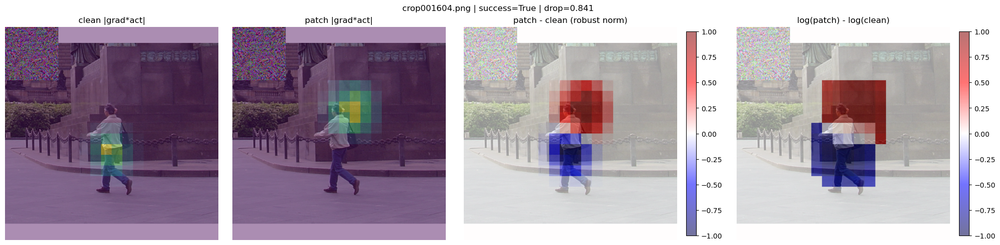

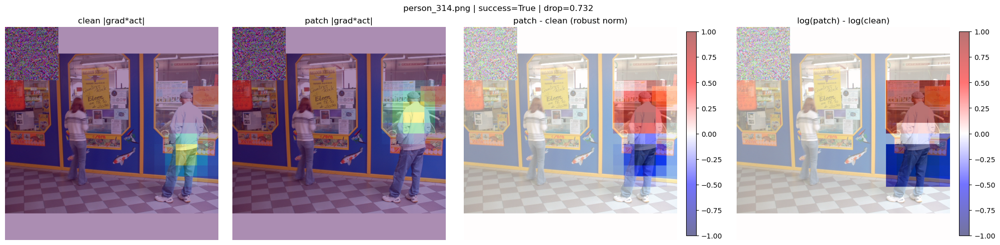

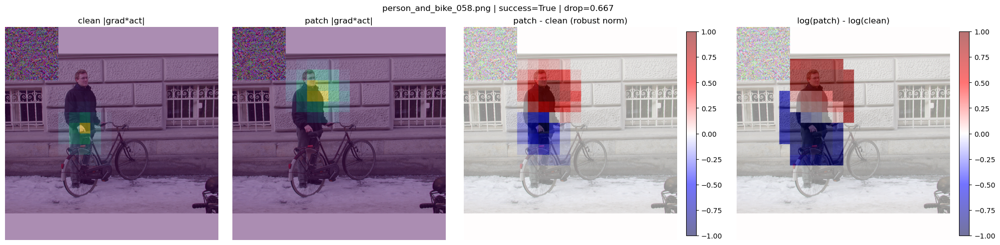

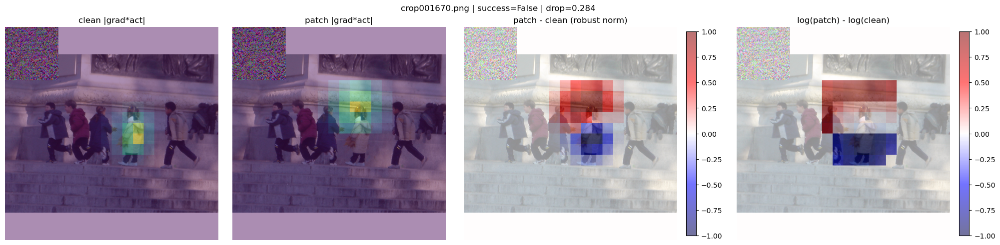

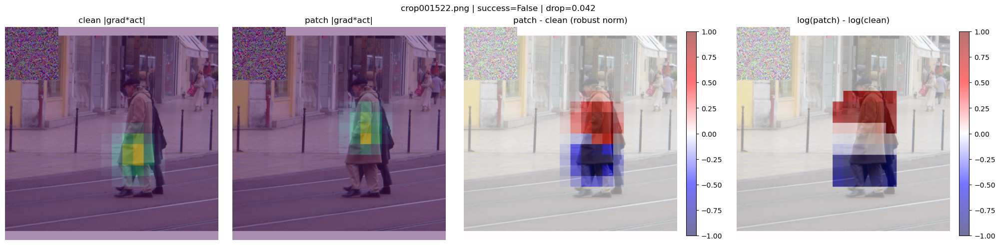

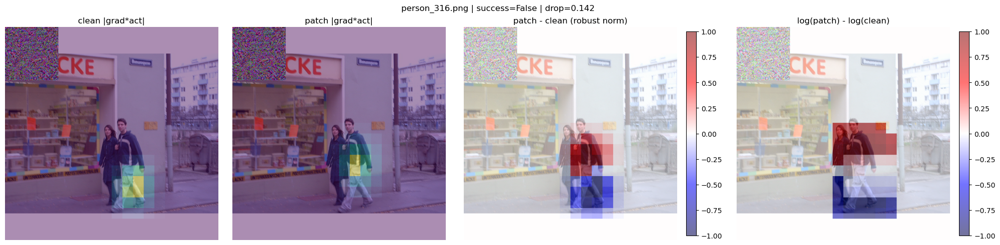

In [13]:
# --- Visualize importance map changes: clean vs patch, diff and log-ratio ---

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from pathlib import Path

IMG_SIZE = int(CFG.imgsz)


def _up_to_imgsz(hw: np.ndarray, imgsz: int = IMG_SIZE) -> np.ndarray:
    """(H,W) -> (imgsz,imgsz) nearest upsample for overlay."""
    t = torch.as_tensor(np.asarray(hw, dtype=np.float32))[None, None, ...]
    up = F.interpolate(t, size=(imgsz, imgsz), mode="nearest")[0, 0].cpu().numpy()
    return up


def _overlay(ax, pil_img, hw_up: np.ndarray, title: str, alpha: float = 0.45, vmin=0.0, vmax=1.0):
    img = np.asarray(pil_img.convert("RGB"))
    ax.imshow(img)
    ax.imshow(hw_up, alpha=float(alpha), vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.axis("off")


def _plot_one_example(d, variant_img: str = "clean"):
    """Show: clean map, patch map, patch-clean (seismic), log-ratio."""
    hw_c = d.get("imp_gxa_hw__clean", None)
    hw_p = d.get("imp_gxa_hw__patch", None)
    if hw_c is None or hw_p is None:
        print("[skip] missing maps for", d.get("path"))
        return

    hw_c = np.asarray(hw_c, dtype=np.float32)
    hw_p = np.asarray(hw_p, dtype=np.float32)

    # for overlays
    up_c = _up_to_imgsz(hw_c)
    up_p = _up_to_imgsz(hw_p)

    # differences
    diff = hw_p - hw_c
    # normalize diff symmetrically for display
    s = float(np.percentile(np.abs(diff[np.isfinite(diff)]), 99.0)) if np.isfinite(diff).any() else 1.0
    s = max(s, 1e-8)
    diff_n = np.clip(diff / s, -1.0, 1.0)
    up_diff = _up_to_imgsz(diff_n)

    # log-ratio (emphasizes relative change)
    eps = 1e-6
    logr = np.log(hw_p + eps) - np.log(hw_c + eps)
    s2 = float(np.percentile(np.abs(logr[np.isfinite(logr)]), 99.0)) if np.isfinite(logr).any() else 1.0
    s2 = max(s2, 1e-8)
    logr_n = np.clip(logr / s2, -1.0, 1.0)
    up_logr = _up_to_imgsz(logr_n)

    # choose background image
    pil_bg = d["clean_lb"] if variant_img == "clean" else d["patched_lb"]

    name = Path(str(d.get("path", "<?>"))).name
    success = bool(d.get("success", False))
    drop = float(d.get("drop", float("nan")))

    fig, axs = plt.subplots(1, 4, figsize=(20, 4.8), constrained_layout=True)
    _overlay(axs[0], pil_bg, up_c, f"clean |grad*act|", alpha=0.45, vmin=0.0, vmax=1.0)
    _overlay(axs[1], pil_bg, up_p, f"patch |grad*act|", alpha=0.45, vmin=0.0, vmax=1.0)

    axs[2].imshow(np.asarray(pil_bg.convert("RGB")))
    im2 = axs[2].imshow(up_diff, alpha=0.55, vmin=-1.0, vmax=1.0, cmap="seismic")
    axs[2].set_title("patch - clean (robust norm)")
    axs[2].axis("off")
    plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04)

    axs[3].imshow(np.asarray(pil_bg.convert("RGB")))
    im3 = axs[3].imshow(up_logr, alpha=0.55, vmin=-1.0, vmax=1.0, cmap="seismic")
    axs[3].set_title("log(patch) - log(clean)")
    axs[3].axis("off")
    plt.colorbar(im3, ax=axs[3], fraction=0.046, pad=0.04)

    plt.suptitle(f"{name} | success={success} | drop={drop:.3f}")
    plt.show()


# ---- pick examples to visualize ----
# Show a few most-changed maps in SUCCESS and FAIL groups (by lowest cosine similarity on HW).

def _pick_most_changed(df: pd.DataFrame, success: bool, n: int = 3, key: str = "cos_hw"):
    sub = df[df.success == success].copy()
    sub = sub[np.isfinite(sub[key].to_numpy(dtype=float))]
    if len(sub) == 0:
        return []
    sub = sub.sort_values(key, ascending=True).head(n)
    paths = set(sub["path"].tolist())
    picked = [d for d in run_data if d.get("path") in paths]
    # keep same order as sub
    order = {p: i for i, p in enumerate(sub["path"].tolist())}
    picked.sort(key=lambda dd: order.get(dd.get("path"), 10**9))
    return picked


N_SHOW = 3
picked_s = _pick_most_changed(imp_change_df, success=True, n=N_SHOW, key="cos_hw")
picked_f = _pick_most_changed(imp_change_df, success=False, n=N_SHOW, key="cos_hw")

print(f"[viz] showing {len(picked_s)} SUCCESS + {len(picked_f)} FAIL examples (most changed by cos_hw)")

for d in picked_s + picked_f:
    _plot_one_example(d, variant_img="patched")

In [14]:
def _plot_one_example(
    d,
    variant_img: str = "clean",
    *,
    save_path: str | Path | None = None,
    show: bool = True,
    dpi: int = 140,
):
    """Show (or save): clean map, patch map, patch-clean (seismic), log-ratio."""
    hw_c = d.get("imp_gxa_hw__clean", None)
    hw_p = d.get("imp_gxa_hw__patch", None)
    if hw_c is None or hw_p is None:
        return False

    hw_c = np.asarray(hw_c, dtype=np.float32)
    hw_p = np.asarray(hw_p, dtype=np.float32)

    up_c = _up_to_imgsz(hw_c)
    up_p = _up_to_imgsz(hw_p)

    diff = hw_p - hw_c
    s = float(np.percentile(np.abs(diff[np.isfinite(diff)]), 99.0)) if np.isfinite(diff).any() else 1.0
    s = max(s, 1e-8)
    diff_n = np.clip(diff / s, -1.0, 1.0)
    up_diff = _up_to_imgsz(diff_n)

    eps = 1e-6
    logr = np.log(hw_p + eps) - np.log(hw_c + eps)
    s2 = float(np.percentile(np.abs(logr[np.isfinite(logr)]), 99.0)) if np.isfinite(logr).any() else 1.0
    s2 = max(s2, 1e-8)
    logr_n = np.clip(logr / s2, -1.0, 1.0)
    up_logr = _up_to_imgsz(logr_n)

    pil_bg = d["clean_lb"] if variant_img == "clean" else d["patched_lb"]

    name = Path(str(d.get("path", "<?>"))).name
    success = bool(d.get("success", False))
    drop = float(d.get("drop", float("nan")))

    fig, axs = plt.subplots(1, 4, figsize=(20, 4.8), constrained_layout=True)
    _overlay(axs[0], pil_bg, up_c, "clean |grad*act|", alpha=0.45, vmin=0.0, vmax=1.0)
    _overlay(axs[1], pil_bg, up_p, "patch |grad*act|", alpha=0.45, vmin=0.0, vmax=1.0)

    axs[2].imshow(np.asarray(pil_bg.convert("RGB")))
    im2 = axs[2].imshow(up_diff, alpha=0.55, vmin=-1.0, vmax=1.0, cmap="seismic")
    axs[2].set_title("patch - clean (robust norm)")
    axs[2].axis("off")
    plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04)

    axs[3].imshow(np.asarray(pil_bg.convert("RGB")))
    im3 = axs[3].imshow(up_logr, alpha=0.55, vmin=-1.0, vmax=1.0, cmap="seismic")
    axs[3].set_title("log(patch) - log(clean)")
    axs[3].axis("off")
    plt.colorbar(im3, ax=axs[3], fraction=0.046, pad=0.04)

    fig.suptitle(f"{name} | success={success} | drop={drop:.3f}")

    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=int(dpi), bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close(fig)

    return True


# --- Batch export: save 4-panel map-change figures for ALL examples (no notebook output) ---

from pathlib import Path
import matplotlib.pyplot as plt

# Используем уже созданный список `examples` на 200 (rebalance), иначе fallback на run_data
pool = examples if ("examples" in globals() and isinstance(examples, list) and len(examples) > 0) else run_data

SAVE_DIR = Path("artifacts") / "imp_change_maps_4panel"
SAVE_DIR.mkdir(parents=True, exist_ok=True)

plt.ioff()  # не рендерить в ноутбуке

n_ok = 0
n_skip = 0
'''
for i, d in enumerate(pool):
    name = Path(str(d.get("path", f"row{i}"))).stem
    success = bool(d.get("success", False))
    drop = float(d.get("drop", float("nan")))

    out = SAVE_DIR / f"{i:04d}__{name}__succ{int(success)}__drop{drop:+.3f}.png"
    ok = _plot_one_example(d, variant_img="patched", save_path=out, show=False, dpi=140)
    if ok:
        n_ok += 1
    else:
        n_skip += 1

print(f"[export] saved={n_ok} skipped={n_skip} -> {SAVE_DIR}")
'''

'\nfor i, d in enumerate(pool):\n    name = Path(str(d.get("path", f"row{i}"))).stem\n    success = bool(d.get("success", False))\n    drop = float(d.get("drop", float("nan")))\n\n    out = SAVE_DIR / f"{i:04d}__{name}__succ{int(success)}__drop{drop:+.3f}.png"\n    ok = _plot_one_example(d, variant_img="patched", save_path=out, show=False, dpi=140)\n    if ok:\n        n_ok += 1\n    else:\n        n_skip += 1\n\nprint(f"[export] saved={n_ok} skipped={n_skip} -> {SAVE_DIR}")\n'